<a href="https://colab.research.google.com/github/himasai97/GANs/blob/main/firstGAN/GAN_MNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing the necessary libraries

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes

def tensor_image_viz(tensor_img, num_images=25, size=(1,28,28)):
  '''
  To visualize images
  Parameters: a tensor of images, number of images and size per image
  Output: prints the images in a uniform grid
  '''
  image_unflat = tensor_img.detach().cpu().view(-1,*size)
  image_grid = make_grid(image_unflat[:num_images], nrow=5)
  plt.imshow(image_grid.permute(1,2,0).squeeze())
  plt.show()


# Building the generator 

In [2]:
def get_gen_block(in_dim, out_dim):
  '''
  To create a block of generator's neural netowrk
  Parameters:
        in_dim: the dimension of the input vector, a scalar
        out_dim: the dimensiono of the output vector, a scalar
  Returns:
        a generator neural network layer consisting of:
         linear transformation (~dense layer, for mapping to another shape)
         Batch Normalization (for stabilization)
         ReLU (a non linear transformation to transform the output)
  '''
  return nn.Sequential(
      nn.Linear(in_dim, out_dim),
      nn.BatchNorm1d(out_dim),
      nn.ReLU(inplace=True),
  )

In [3]:
class Generator(nn.Module):
  '''
  Generator Class with values:
      noise_dim: the dimension of noise vector, a scalar
      img_dim: the dimension of the images, set for the dataset used, a scalar
          (For the MNIST images, the dim is 28 x 28 = 784)
      hidden_dim: the inner dimension, a scalar
  '''
  def __init__(self, noise_dim=10, img_dim=784, hidden_dim=128):
    super(Generator, self).__init__()
    # Build the neural network with 5 blocks
    self.gen = nn.Sequential(
        get_gen_block(noise_dim, hidden_dim),
        get_gen_block(hidden_dim, hidden_dim*2),
        get_gen_block(hidden_dim*2, hidden_dim*4),
        get_gen_block(hidden_dim*4, hidden_dim*8),
        nn.Linear(hidden_dim*8, img_dim),
        nn.Sigmoid()
    )

  def forward(self, noise):
    '''
    To complete a forward pass of the generator
    Parameters:
          noise: a noise tensor with (n_samples, noise_dim) dimension
    Returns:
          generated images with img_dim dimension using the gen model
    '''
    return self.gen(noise)



# Creating Noise Vectors

In [4]:
def get_noise(n_samples, noise_dim, device='cpu'):
  '''
  To create noise vectors
  Parameters:
        n_samples: the number of samples to generate, a scalar
        noise_dim: the dimension of the noise vector, a scalar
        device: the type of device used to generate the noise
                To use this on GPU, device='cuda'
  Returns:
        a tensor of (n_samples, noise_dim) dimension filled with random numbers from the normal distribution
  '''
  return torch.randn(n_samples, noise_dim, device=device)


In [5]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

print('Getting noise tensor using CPU')
test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    print('Getting noise tensor using GPU')
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Getting noise tensor using CPU
Getting noise tensor using GPU
Success!


# Building the Discriminator

In [6]:
def get_disc_block(in_dim, out_dim):
  '''
  To create a block of discriminator's neural network
  Parameters:
        in_dim: the dimension of the input vector, a scalar
        out_dim: the dimension of the output vector, a scalar
  Returns:
        a discriminator neural network layer, consisting of:
          a linear transformation (~ a dense layer)
          a LeakyReLU activation with negative slope of 0.2
  '''
  return nn.Sequential(
      nn.Linear(in_dim, out_dim),
      nn.LeakyReLU(0.2, inplace=True)
  )

In [7]:
class Discriminator(nn.Module):
  '''
  Discriminator Class with Values:
      img_dim: the dimension of the images, set for the dataset used, a scalar
        (For the MNIST images, the dimension is 28x28 = 784)
      hidden_dim: the inner dimension, a scalar
  '''
  def __init__(self, img_dim=784, hidden_dim=128):
    super(Discriminator, self).__init__()
    #Build the neural network with 4 layers
    self.disc = nn.Sequential(
        get_disc_block(img_dim, hidden_dim*4),
        get_disc_block(hidden_dim*4, hidden_dim*2),
        get_disc_block(hidden_dim*2, hidden_dim),
        nn.Linear(hidden_dim, 1)
    )
  
  def forward(self, image):
    '''
    To complete a forward pass of the discriminator
    Parameters:
          images: a flattened image tensor with img_dim dimension
    Returns:
          a 1-dimension tensor indicating if the input images are fake/real
    '''
    return self.disc(image)  

# Training the model

In [8]:
# Set the parameters
criterion = nn.BCEWithLogitsLoss() # the loss function
n_epochs = 200 # no. of iterations through the dataset when training
noise_dim = 64 # the dimension of the noise vector
viz_step = 500 # how often to display/visualize the images
batch_size = 128 # the number of images per forward/backward pass
lr = 0.00001 # the learning rate
device = 'cuda' #the device type (here using a GPU, which runs on CUDA)

#Load MNIST dataset as tensors using a dataloader
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size = batch_size,
    shuffle=True
    )


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw




Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Initialize Generator, Discriminator, and their corresponding Adam optimizers.

In [9]:
gen = Generator(noise_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Loss functions for the discriminator and generator

In [10]:
def get_disc_loss(gen, disc, criterion, real_img, num_img, noise_dim, device):
  '''
  Calculate the loss of the discriminator
  Parameters:
        gen: the generator model, which returns an image generated from a noise of noise_dim dimension
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which is used to compare the discriminator's prediction to the ground truth reality of the images
          (here, fake = 0, real = 1)
        real_img: a batch of real images
        num_img: the number of images created by the generator,
                  which is also the length of the real images
        noise_dim: the dimension of the noise vector, a scalar
        device: the device type
  Returns:
        disc_loss: a torch scalar of the loss value for the current batch
  '''
  # create noise vectors
  noise_vec = get_noise(num_img, noise_dim, device=device)
  # generate a batch of images using the generator model
  fake_img = gen(noise_vec)
  # get the discriminator's prediction of the fake image
  fake_pred = disc(fake_img.detach()) #after detaching the generator
  # create a ground truth tensor for the fake images, which would be all zeros
  grnd_truth_fake = torch.zeros_like(fake_pred)
  # calculate loss
  fake_loss = criterion(fake_pred, grnd_truth_fake)
  # repeat for the prediction and loss steps for the real images
  real_pred = disc(real_img)
  grnd_truth_real =torch.ones_like(real_pred)
  real_loss = criterion(real_pred, grnd_truth_real)
  # calculate the discriminator's loss by averaging the real and fake loss
  disc_loss = (fake_loss + real_loss) / 2
  return disc_loss

In [11]:
def get_gen_loss(gen, disc, criterion, num_img, noise_dim, device):
  '''
  Calculate the loss of the generator
  Parameters:
        gen: the generator model, which returns an image generated from a noise of noise_dim dimension
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which is used to compare the discriminator's prediction to the ground truth reality of the images
          (here, fake = 0, real = 1)
        real_img: a batch of real images
        num_img: the number of images created by the generator,
                  which is also the length of the real images
        noise_dim: the dimension of the noise vector, a scalar
        device: the device type
  Returns:
        gen_loss: a torch scalar of the loss value for the current batch
  '''
  # create noise vectors
  noise_vec = get_noise(num_img, noise_dim, device=device)
  # generate a batch of fake images
  fake_img = gen(noise_vec)
  # get the discriminator's prediction of the fake image
  fake_pred = disc(fake_img) #after detaching the generator
  # calculate generator's loss
  target_truth = torch.ones_like(fake_pred) #target here is to make the discriminator think its fake images are real
  gen_loss = criterion(fake_pred, target_truth)
  return gen_loss


# Putting it all together
 For each epoch, the entire dataset is processed in batches, where the discriminator and the generator are updated for each batch after their respective loss functions are calculated.

Step 500: Generator loss: 1.3784084128141412, discriminator loss: 0.42099971985816953


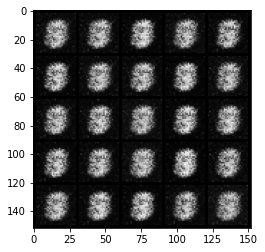

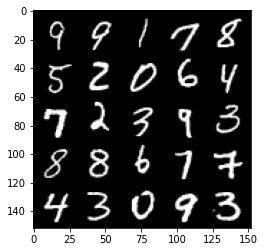

Step 1000: Generator loss: 1.6606349675655363, discriminator loss: 0.3047209573090072


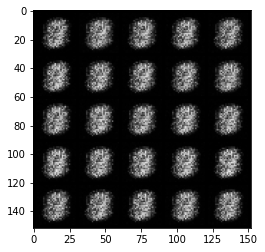

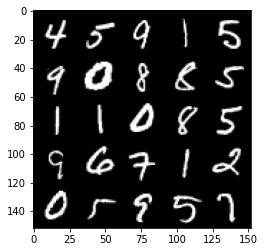

Step 1500: Generator loss: 1.9337087130546557, discriminator loss: 0.17911059093475357


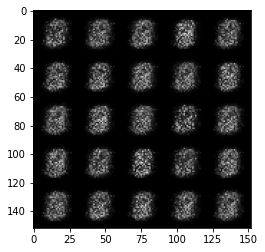

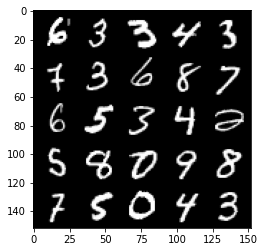

Step 2000: Generator loss: 1.715289153814317, discriminator loss: 0.204454376399517


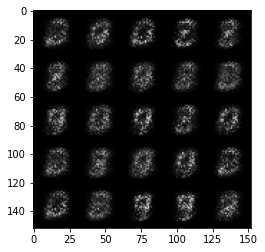

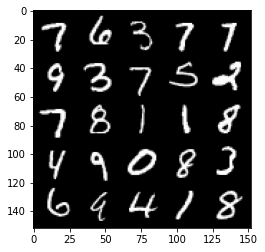

Step 2500: Generator loss: 1.5782433886528018, discriminator loss: 0.23478498798608793


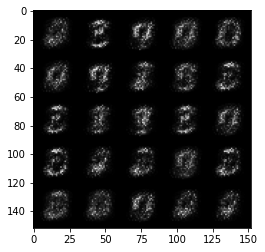

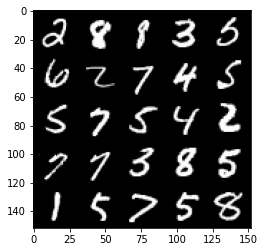

Step 3000: Generator loss: 1.8713829553127297, discriminator loss: 0.17857664594054223


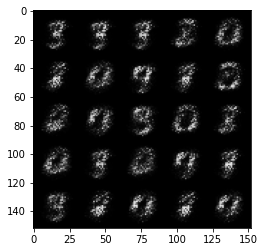

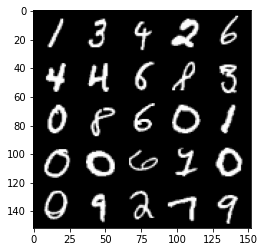

Step 3500: Generator loss: 2.337076840400698, discriminator loss: 0.12713179877400402


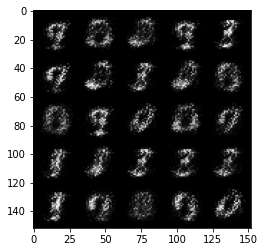

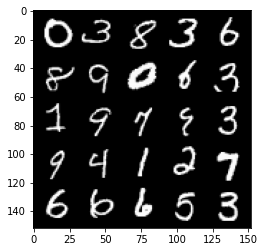

Step 4000: Generator loss: 2.727896573066714, discriminator loss: 0.10695950011909004


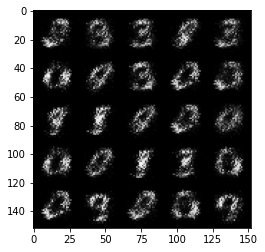

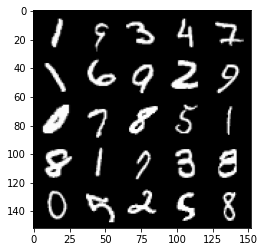

Step 4500: Generator loss: 3.090240412235259, discriminator loss: 0.08777322370558972


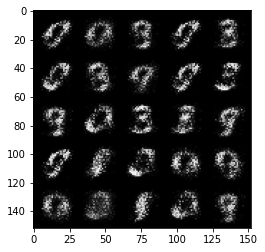

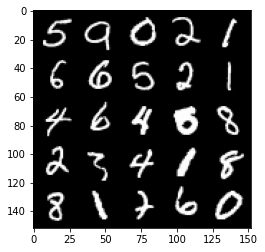

Step 5000: Generator loss: 3.453696399211882, discriminator loss: 0.08342749176919463


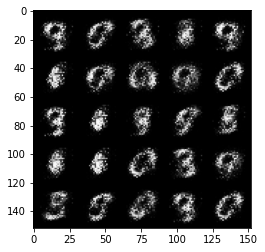

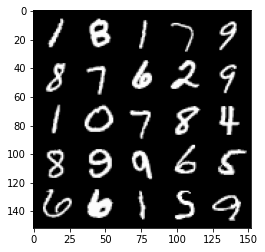

Step 5500: Generator loss: 3.4531607117652867, discriminator loss: 0.07445292090624576


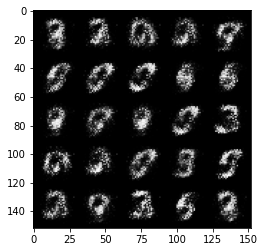

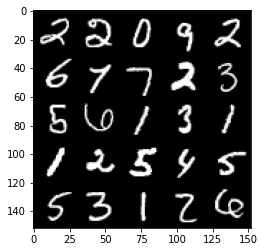

Step 6000: Generator loss: 3.69992960548401, discriminator loss: 0.0684437251091003


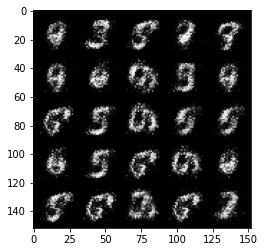

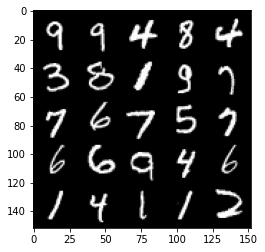

Step 6500: Generator loss: 3.9469129252433803, discriminator loss: 0.05908060123771433


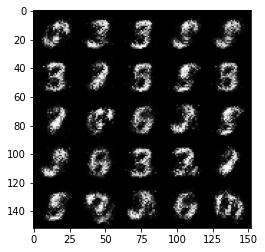

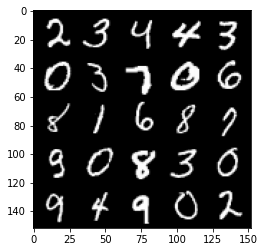

Step 7000: Generator loss: 4.001017918109896, discriminator loss: 0.06095931684970852


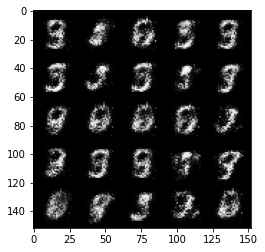

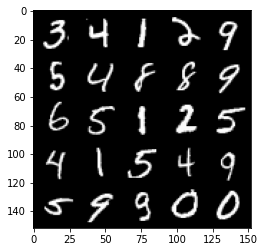

Step 7500: Generator loss: 3.8788145017623914, discriminator loss: 0.06175324838235976


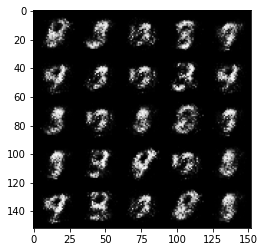

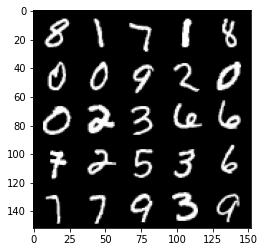

Step 8000: Generator loss: 3.7674491176605227, discriminator loss: 0.06892149775475262


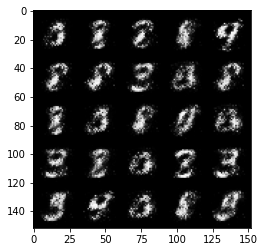

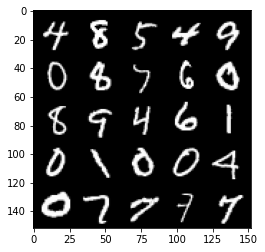

Step 8500: Generator loss: 3.9429453716278133, discriminator loss: 0.06591824454814202


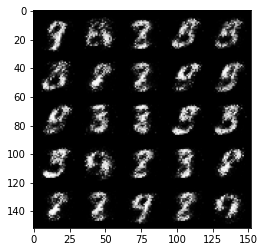

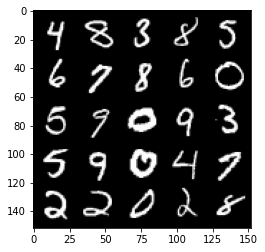

Step 9000: Generator loss: 3.9366889686584488, discriminator loss: 0.06571472470462317


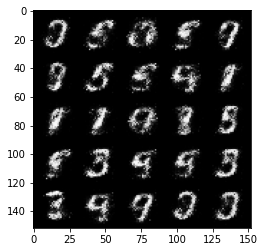

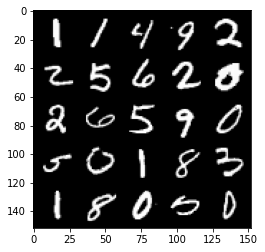

Step 9500: Generator loss: 3.9321109471321116, discriminator loss: 0.06638964194804428


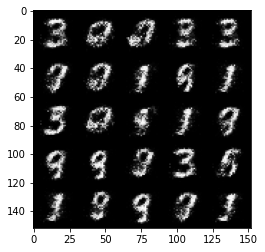

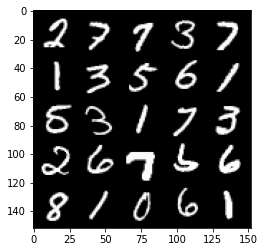

Step 10000: Generator loss: 3.960550596714018, discriminator loss: 0.057455732971429835


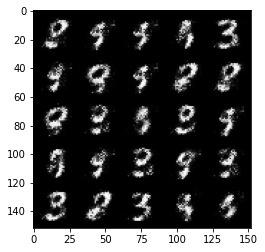

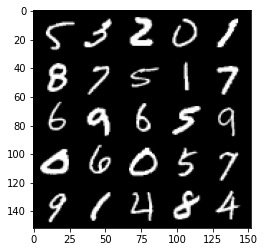

Step 10500: Generator loss: 4.047589933395384, discriminator loss: 0.054854748744517554


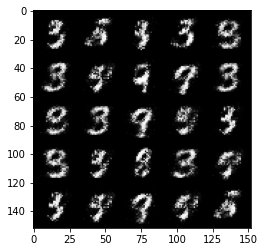

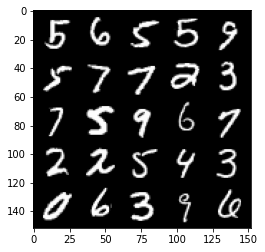

Step 11000: Generator loss: 4.231202264308927, discriminator loss: 0.057696834158152355


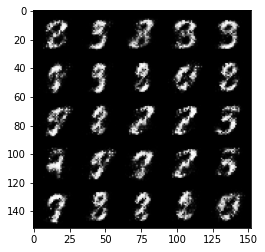

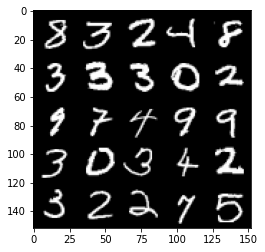

Step 11500: Generator loss: 4.0456312022209175, discriminator loss: 0.06725382592529057


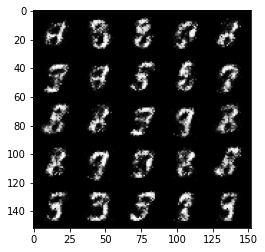

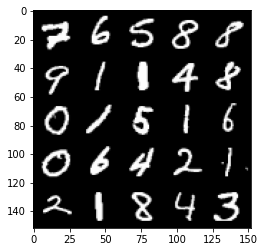

Step 12000: Generator loss: 4.143336231708525, discriminator loss: 0.07575972608476882


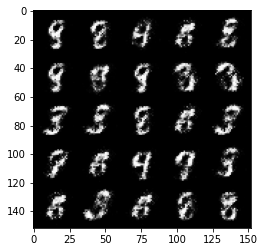

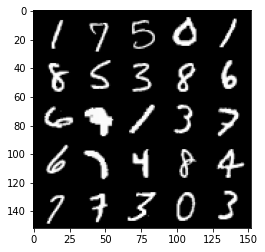

Step 12500: Generator loss: 4.189259910106659, discriminator loss: 0.06779591958969827


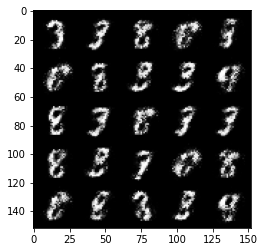

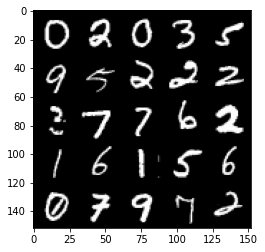

Step 13000: Generator loss: 3.9989679331779486, discriminator loss: 0.07138224810361862


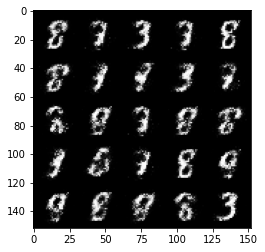

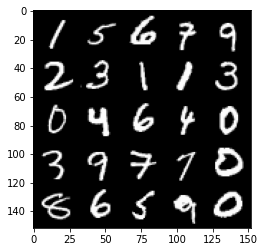

Step 13500: Generator loss: 3.985954535484317, discriminator loss: 0.08780688453838226


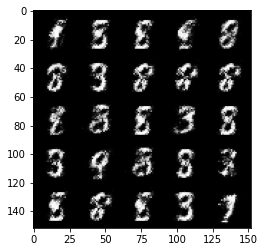

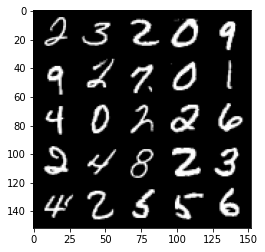

Step 14000: Generator loss: 3.837999613285062, discriminator loss: 0.08727152021974328


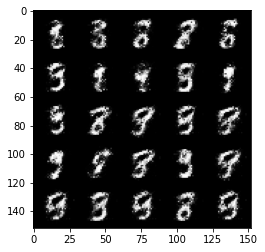

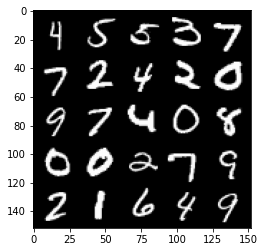

Step 14500: Generator loss: 3.894641678333283, discriminator loss: 0.0802177397757768


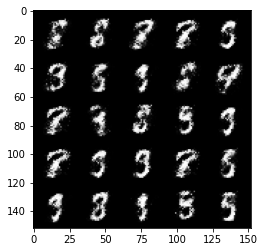

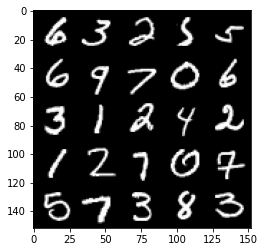

Step 15000: Generator loss: 3.9834629545211784, discriminator loss: 0.08023358485102652


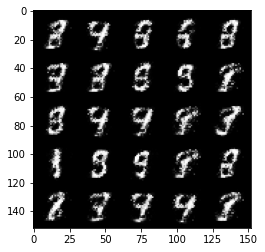

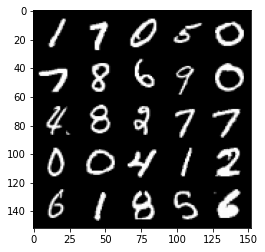

Step 15500: Generator loss: 3.8075744547843944, discriminator loss: 0.09917580176889884


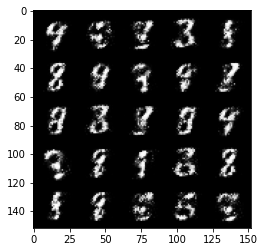

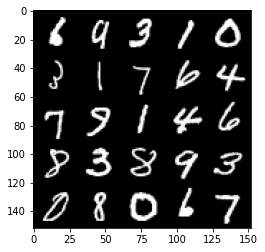

Step 16000: Generator loss: 3.5998160281181373, discriminator loss: 0.11393696409463888


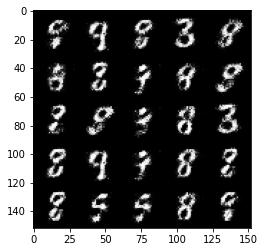

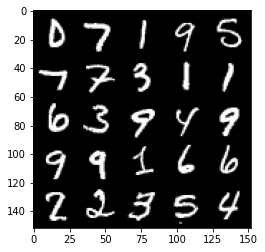

Step 16500: Generator loss: 3.491292924404139, discriminator loss: 0.11965110293775794


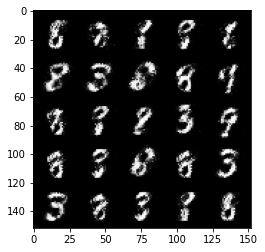

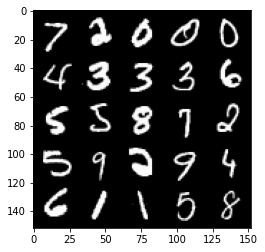

Step 17000: Generator loss: 3.555523561954498, discriminator loss: 0.11843460877239705


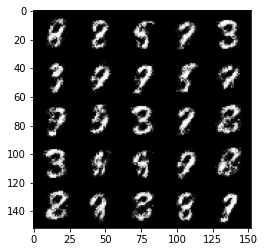

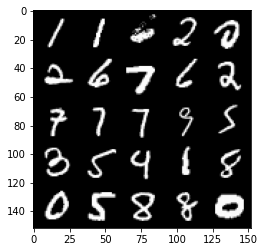

Step 17500: Generator loss: 3.5540067405700677, discriminator loss: 0.1227360784336924


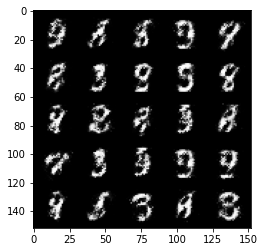

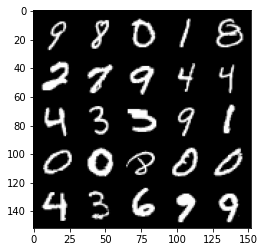

Step 18000: Generator loss: 3.58009435892105, discriminator loss: 0.1426070954576134


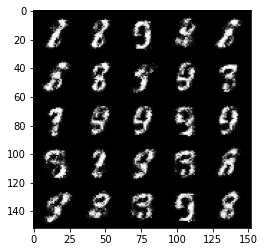

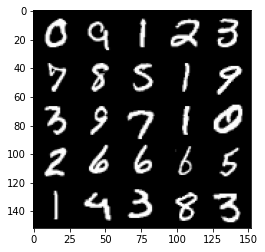

Step 18500: Generator loss: 3.515491812705993, discriminator loss: 0.14075394239276653


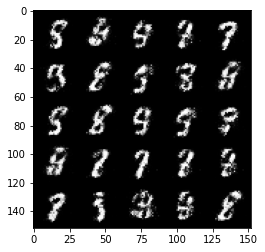

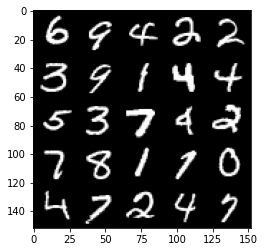

Step 19000: Generator loss: 3.553503551483154, discriminator loss: 0.12869371502101418


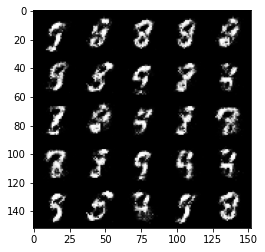

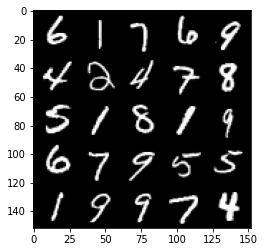

Step 19500: Generator loss: 3.483255058765411, discriminator loss: 0.13184619933366773


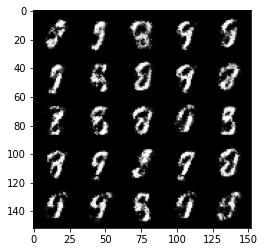

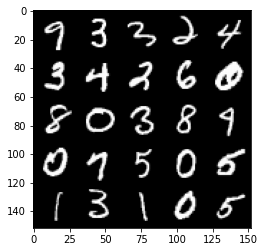

Step 20000: Generator loss: 3.2704527969360386, discriminator loss: 0.15665002296864977


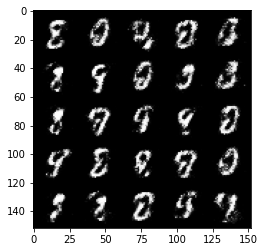

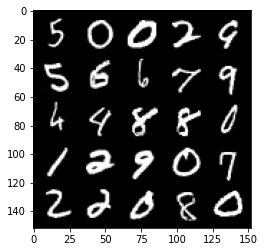

Step 20500: Generator loss: 3.2033819217681896, discriminator loss: 0.156659419208765


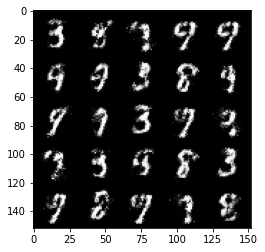

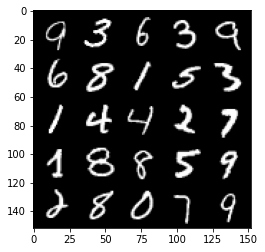

Step 21000: Generator loss: 3.284061353683471, discriminator loss: 0.1535475275963545


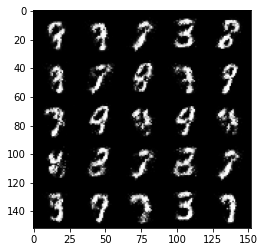

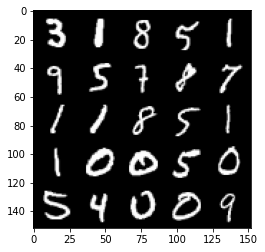

Step 21500: Generator loss: 3.267562069892879, discriminator loss: 0.16525108677148823


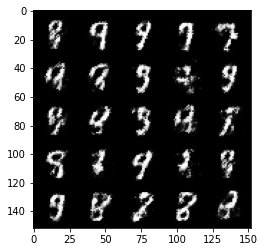

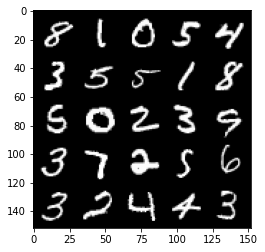

Step 22000: Generator loss: 3.1317833166122417, discriminator loss: 0.17059654337167737


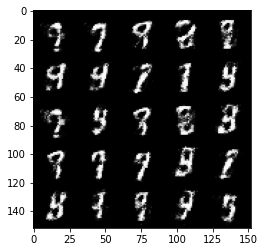

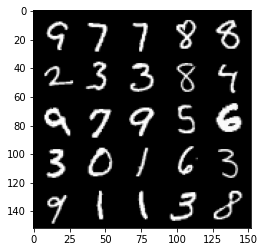

Step 22500: Generator loss: 3.0728391695022577, discriminator loss: 0.17086058811843405


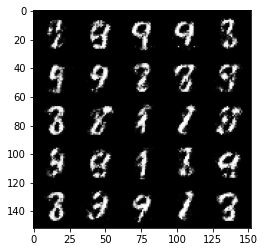

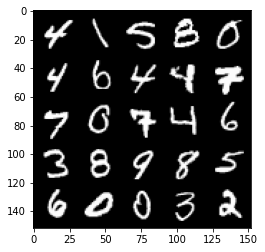

Step 23000: Generator loss: 3.049190076828002, discriminator loss: 0.17276239392161352


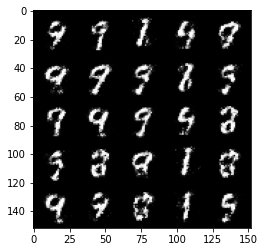

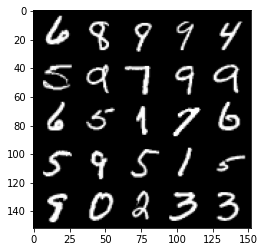

Step 23500: Generator loss: 3.0303908524513217, discriminator loss: 0.19110460807383062


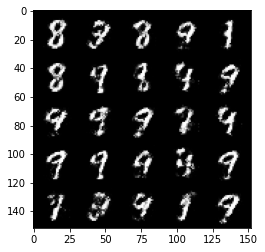

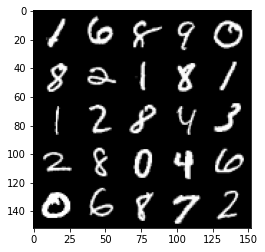

Step 24000: Generator loss: 3.0093646297454835, discriminator loss: 0.19954769217967966


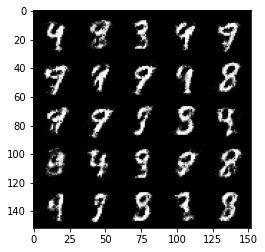

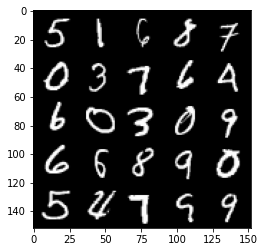

Step 24500: Generator loss: 2.900409868240355, discriminator loss: 0.208183698952198


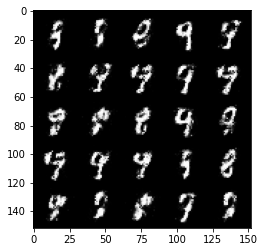

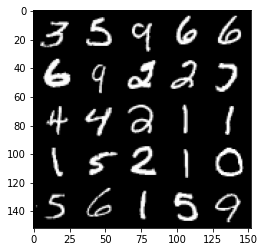

Step 25000: Generator loss: 2.993597549438476, discriminator loss: 0.18946397085487834


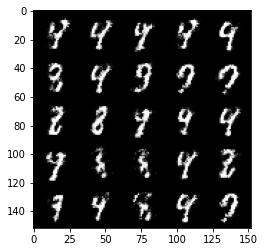

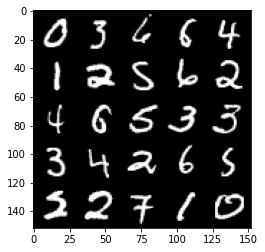

Step 25500: Generator loss: 3.0256181883811935, discriminator loss: 0.1844118163883685


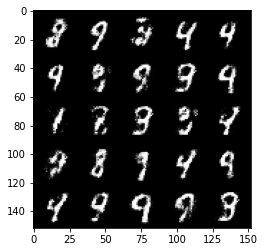

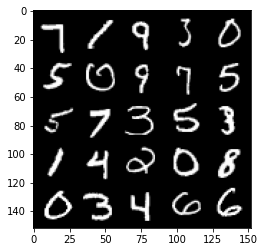

Step 26000: Generator loss: 2.7929028882980327, discriminator loss: 0.20261264126002793


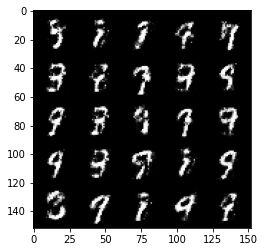

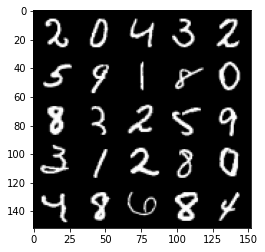

Step 26500: Generator loss: 2.8904617638587937, discriminator loss: 0.18986211103200895


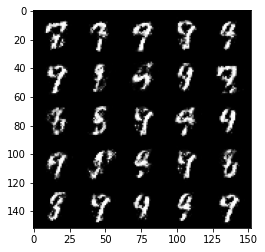

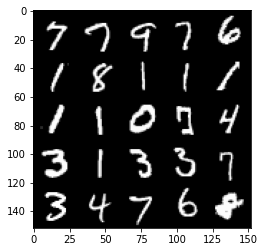

Step 27000: Generator loss: 2.827903229236602, discriminator loss: 0.19485821561515343


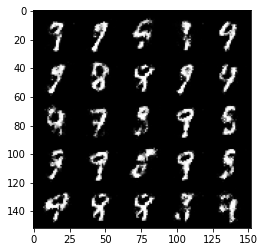

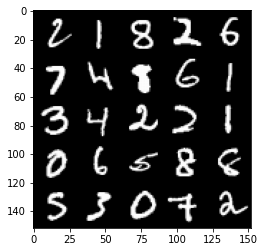

Step 27500: Generator loss: 2.93178077507019, discriminator loss: 0.16979141724109625


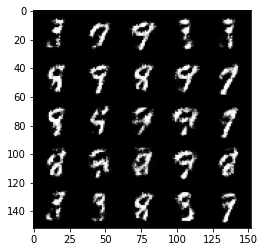

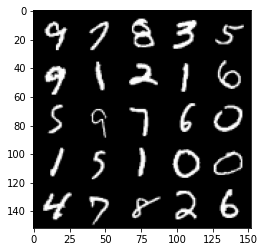

Step 28000: Generator loss: 2.913312552928924, discriminator loss: 0.19649442183971397


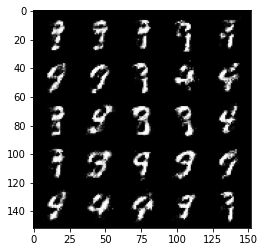

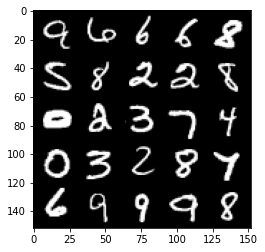

Step 28500: Generator loss: 2.875277148246766, discriminator loss: 0.2142406243234874


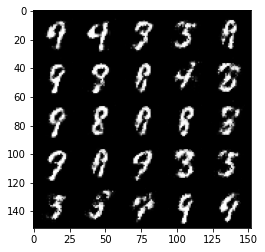

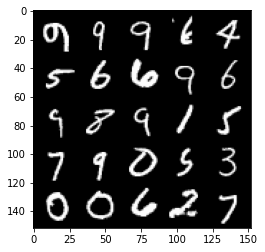

Step 29000: Generator loss: 2.830551441192628, discriminator loss: 0.20344543647766097


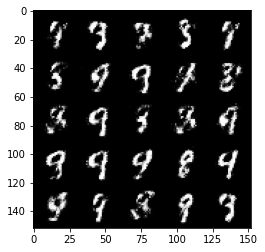

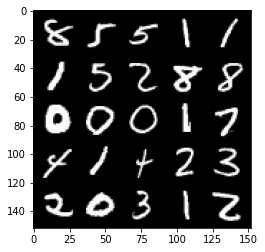

Step 29500: Generator loss: 2.76553795003891, discriminator loss: 0.20839104211330453


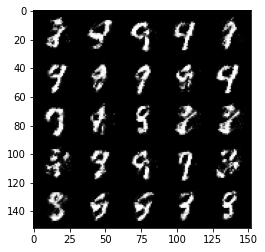

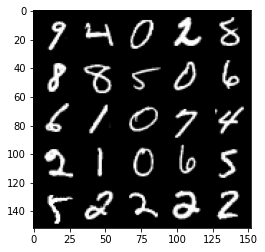

Step 30000: Generator loss: 2.6465050144195565, discriminator loss: 0.22441224965453171


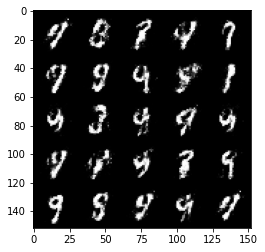

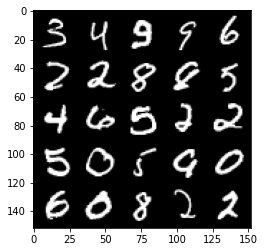

Step 30500: Generator loss: 2.7909842309951776, discriminator loss: 0.19516181483864764


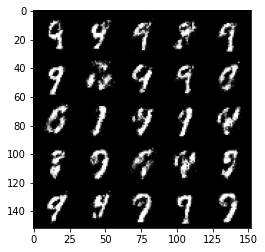

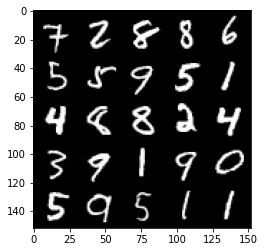

Step 31000: Generator loss: 2.6977820653915434, discriminator loss: 0.21252679829299453


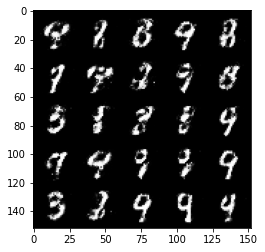

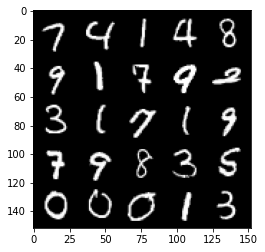

Step 31500: Generator loss: 2.6040016512870774, discriminator loss: 0.24344658046960824


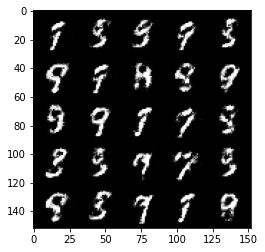

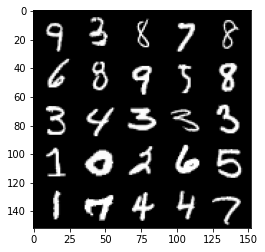

Step 32000: Generator loss: 2.5341768863201146, discriminator loss: 0.23858842849731485


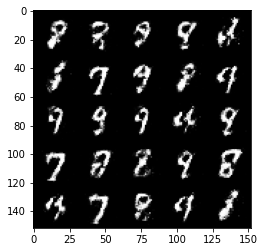

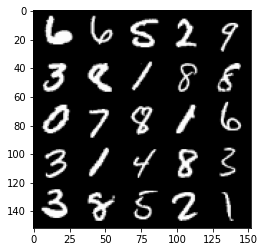

Step 32500: Generator loss: 2.47329618382454, discriminator loss: 0.2630658254027367


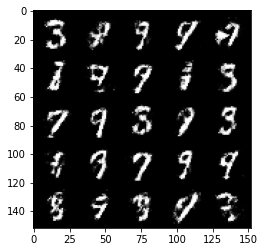

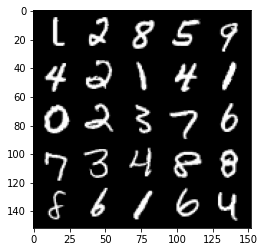

Step 33000: Generator loss: 2.440046528339387, discriminator loss: 0.25211622703075415


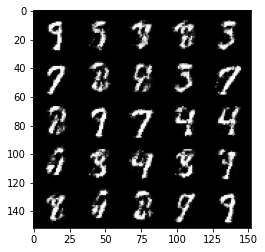

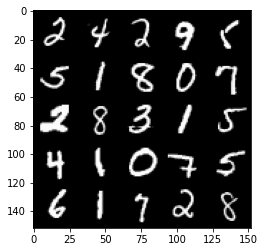

Step 33500: Generator loss: 2.4213532373905196, discriminator loss: 0.2608864966928959


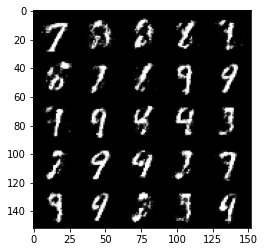

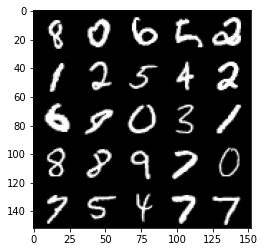

Step 34000: Generator loss: 2.4098411376476254, discriminator loss: 0.25484889701008795


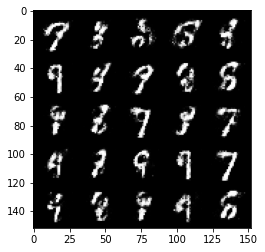

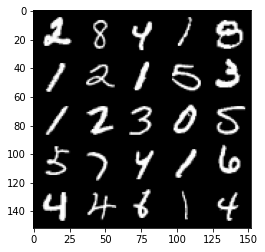

Step 34500: Generator loss: 2.409919995784758, discriminator loss: 0.2554048091471195


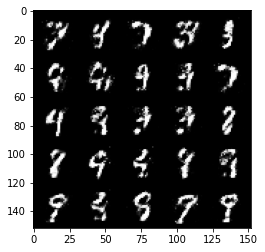

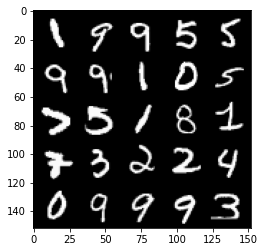

Step 35000: Generator loss: 2.4169589672088634, discriminator loss: 0.2791252296864988


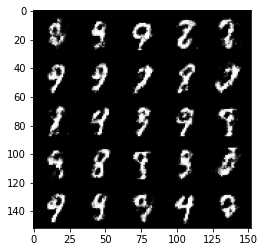

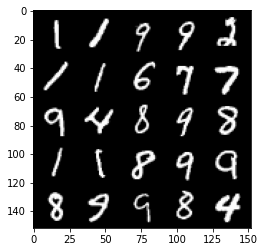

Step 35500: Generator loss: 2.3962912783622734, discriminator loss: 0.27968289399147056


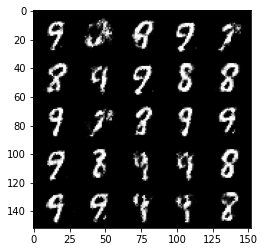

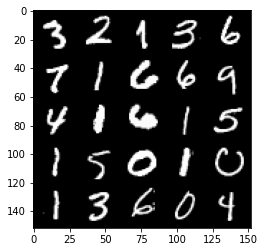

Step 36000: Generator loss: 2.3291101815700515, discriminator loss: 0.2853820247054103


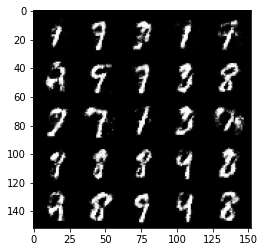

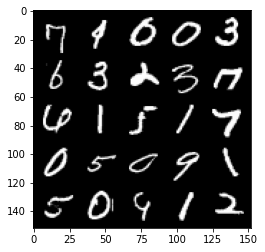

Step 36500: Generator loss: 2.2818894429206864, discriminator loss: 0.28339968335628535


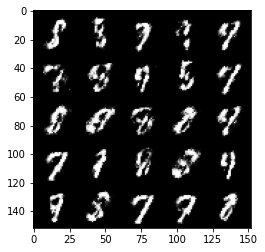

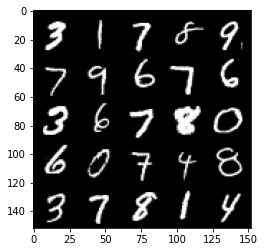

Step 37000: Generator loss: 2.185207398653031, discriminator loss: 0.2971859827935697


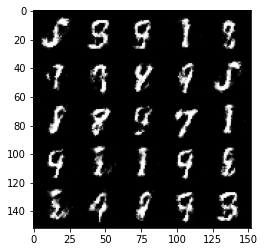

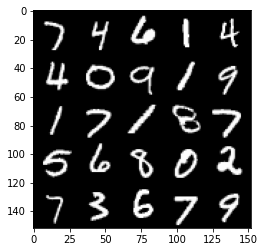

Step 37500: Generator loss: 2.2505098621845248, discriminator loss: 0.2771328767538073


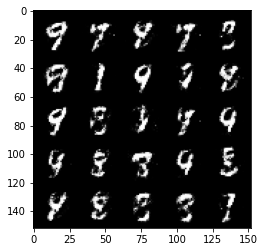

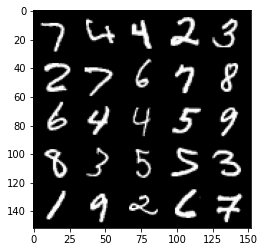

Step 38000: Generator loss: 2.453920735120774, discriminator loss: 0.23492913362383833


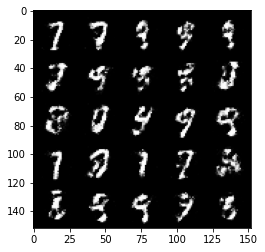

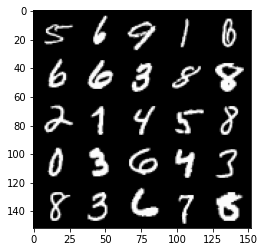

Step 38500: Generator loss: 2.2946869969367962, discriminator loss: 0.2730452869832516


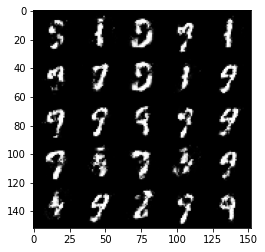

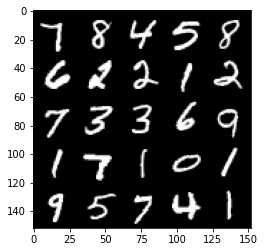

Step 39000: Generator loss: 2.2155908150672907, discriminator loss: 0.2948432553708556


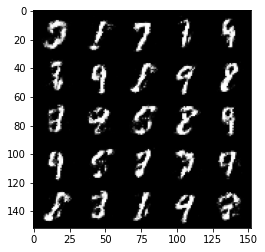

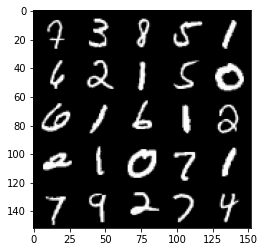

Step 39500: Generator loss: 2.2767716331481944, discriminator loss: 0.28232755741477006


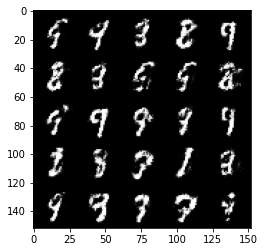

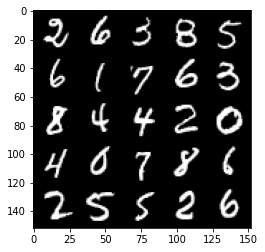

Step 40000: Generator loss: 2.2534011235237137, discriminator loss: 0.2851273604929447


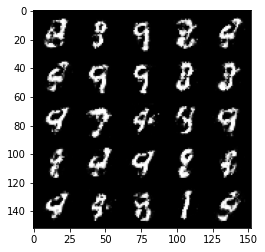

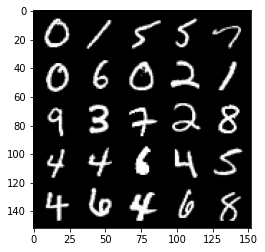

Step 40500: Generator loss: 2.283554098606111, discriminator loss: 0.2793685109615324


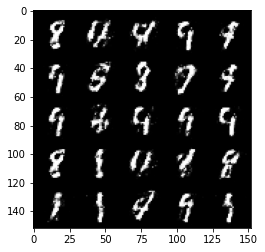

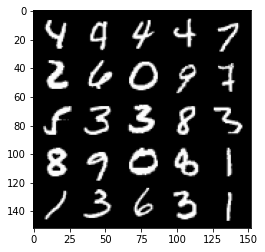

Step 41000: Generator loss: 2.1930670006275177, discriminator loss: 0.2899708063304425


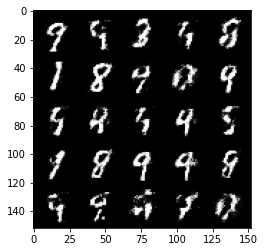

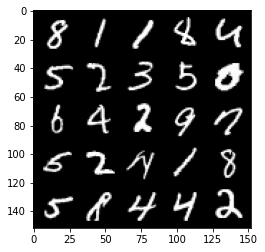

Step 41500: Generator loss: 2.22920711350441, discriminator loss: 0.28276216176152225


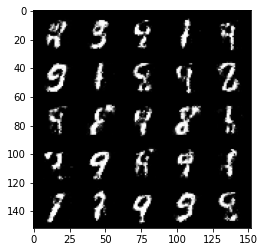

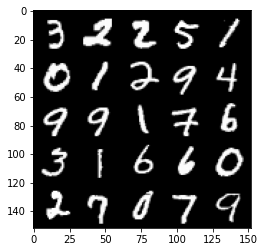

Step 42000: Generator loss: 2.1218644840717324, discriminator loss: 0.2909781011641029


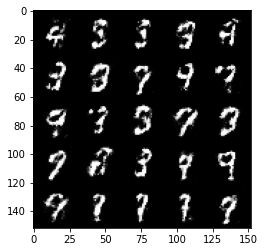

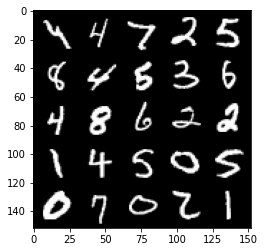

Step 42500: Generator loss: 2.1473552575111374, discriminator loss: 0.2967511644959453


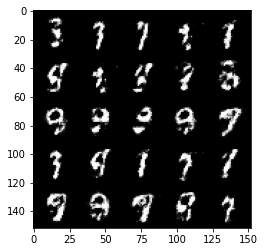

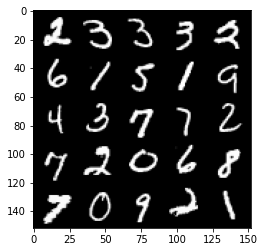

Step 43000: Generator loss: 2.1408320457935313, discriminator loss: 0.31031098526716216


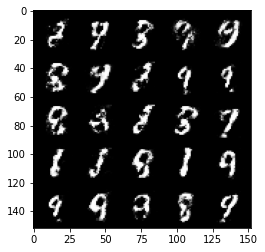

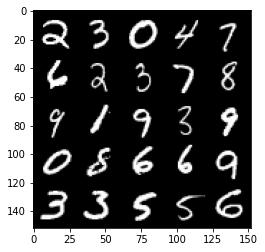

Step 43500: Generator loss: 2.071211890697477, discriminator loss: 0.2997005256712438


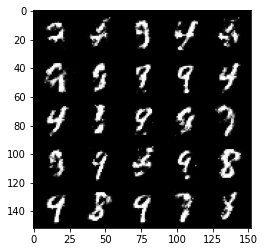

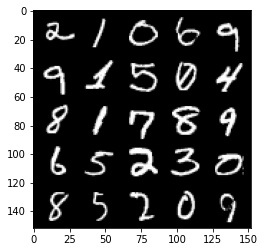

Step 44000: Generator loss: 2.179866858005524, discriminator loss: 0.28279767793416966


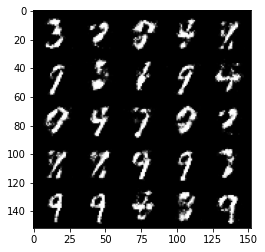

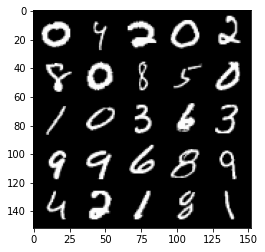

Step 44500: Generator loss: 2.177009723663329, discriminator loss: 0.2856797517538071


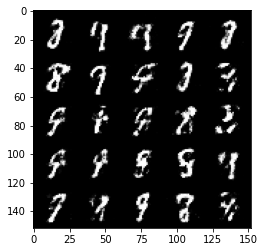

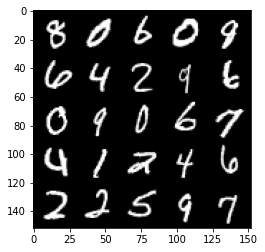

Step 45000: Generator loss: 2.2416287727355946, discriminator loss: 0.27954376199841496


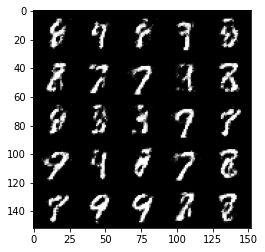

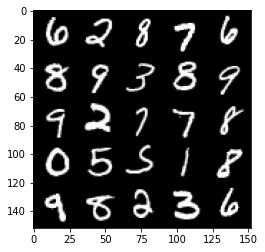

Step 45500: Generator loss: 2.117395396709442, discriminator loss: 0.30987293660640725


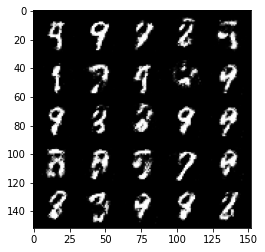

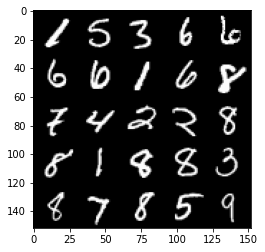

Step 46000: Generator loss: 2.1298675518035894, discriminator loss: 0.30347147217392956


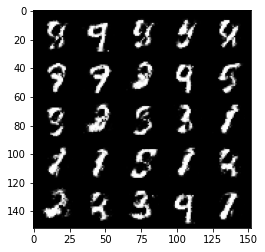

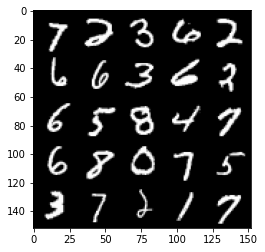

Step 46500: Generator loss: 1.9669468078613275, discriminator loss: 0.342796246230602


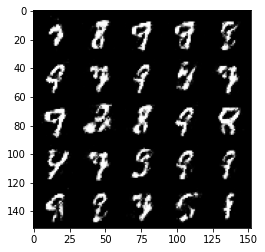

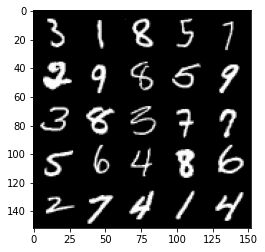

Step 47000: Generator loss: 1.9893320937156682, discriminator loss: 0.33963521635532407


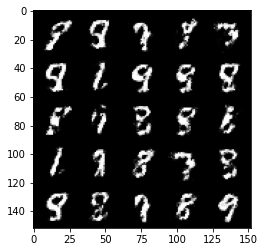

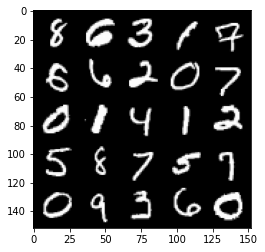

Step 47500: Generator loss: 2.017320862054826, discriminator loss: 0.3216265970468518


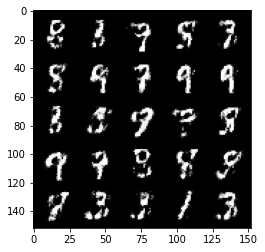

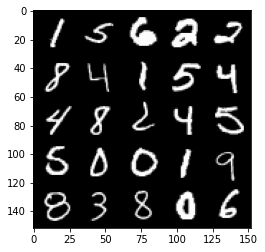

Step 48000: Generator loss: 2.0759723002910606, discriminator loss: 0.32323657041788106


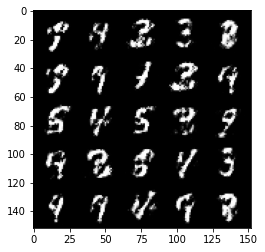

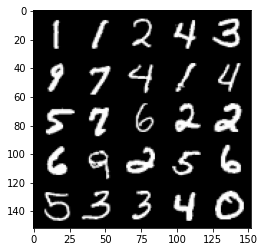

Step 48500: Generator loss: 1.9337301368713367, discriminator loss: 0.3522930614650247


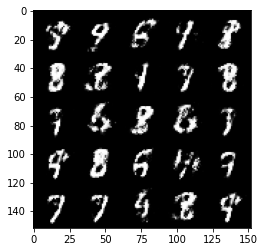

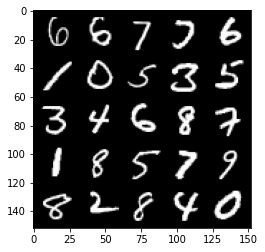

Step 49000: Generator loss: 1.906472426176071, discriminator loss: 0.33988971495628334


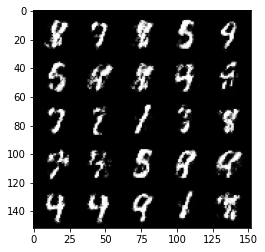

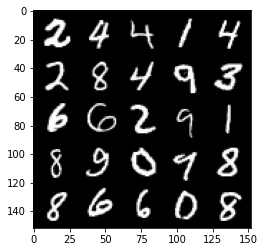

Step 49500: Generator loss: 1.9281406664848344, discriminator loss: 0.3366964880228045


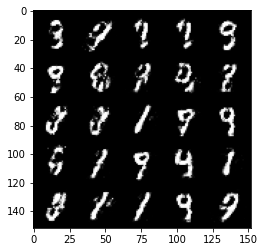

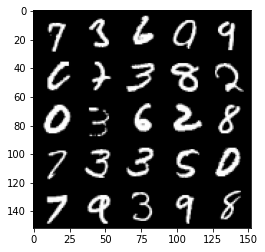

Step 50000: Generator loss: 1.9509725818634056, discriminator loss: 0.33838643988966954


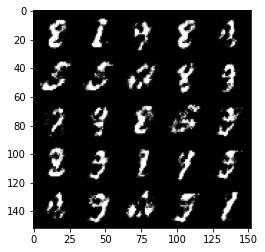

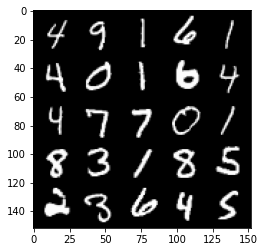

Step 50500: Generator loss: 2.0137305860519397, discriminator loss: 0.3166393948197363


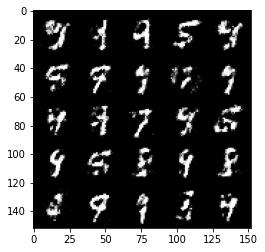

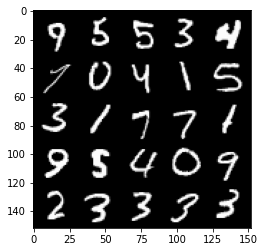

Step 51000: Generator loss: 2.0388276014328, discriminator loss: 0.32647343620657926


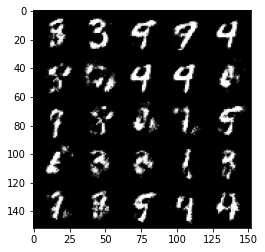

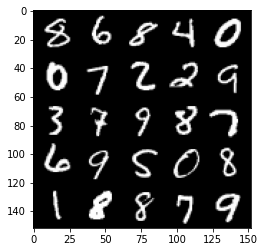

Step 51500: Generator loss: 1.9735315270423892, discriminator loss: 0.32198402911424584


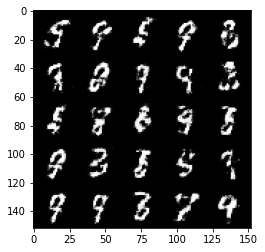

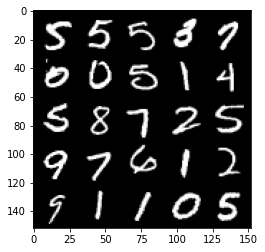

Step 52000: Generator loss: 2.0004533574581154, discriminator loss: 0.32318246883153906


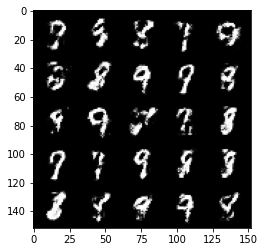

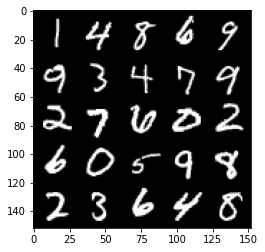

Step 52500: Generator loss: 1.8727640883922583, discriminator loss: 0.3653223075270655


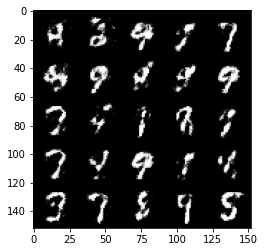

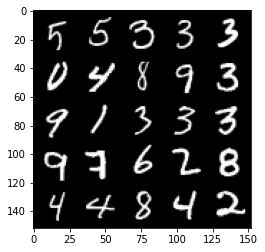

Step 53000: Generator loss: 1.800551843166353, discriminator loss: 0.3767750567197796


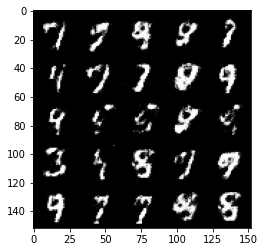

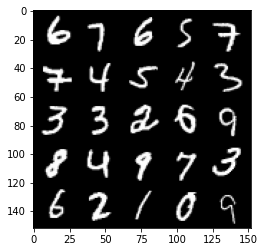

Step 53500: Generator loss: 1.8203387629985817, discriminator loss: 0.3404449733793736


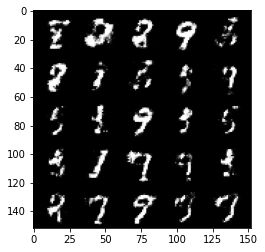

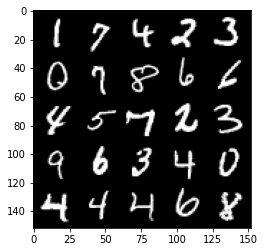

Step 54000: Generator loss: 1.9893372397422813, discriminator loss: 0.3174730466008186


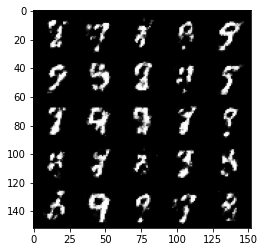

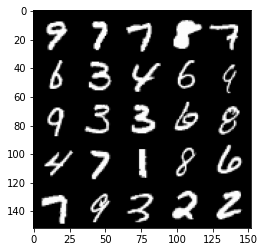

Step 54500: Generator loss: 1.8506326851844803, discriminator loss: 0.3599342652559278


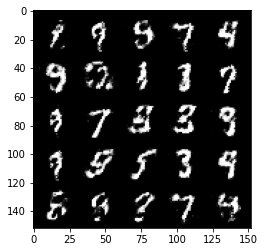

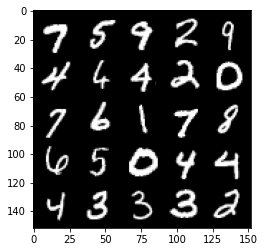

Step 55000: Generator loss: 1.8543545584678653, discriminator loss: 0.36031171754002583


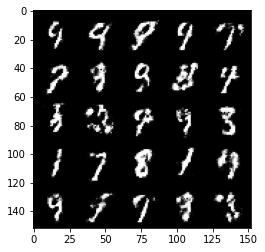

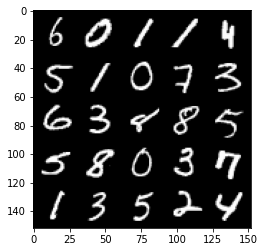

Step 55500: Generator loss: 1.840593375205994, discriminator loss: 0.36251181960105916


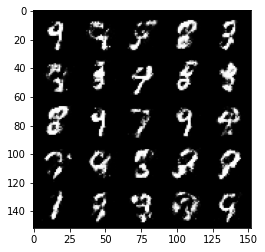

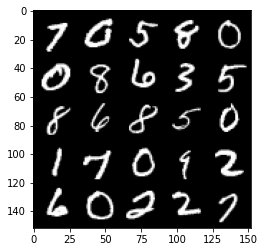

Step 56000: Generator loss: 1.8031263470649717, discriminator loss: 0.3763276708126067


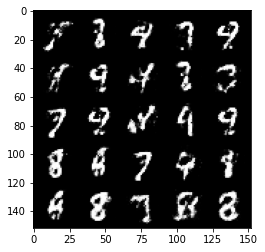

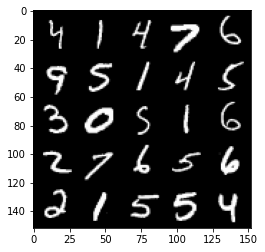

Step 56500: Generator loss: 1.7512133843898767, discriminator loss: 0.3942768551707268


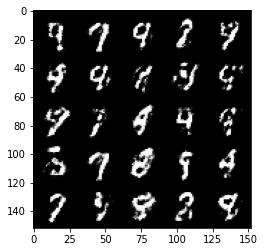

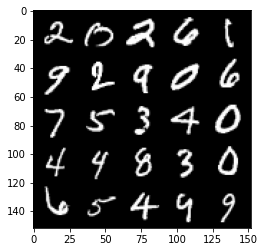

Step 57000: Generator loss: 1.7032241265773769, discriminator loss: 0.40172031980752926


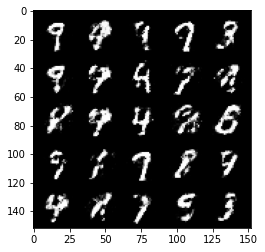

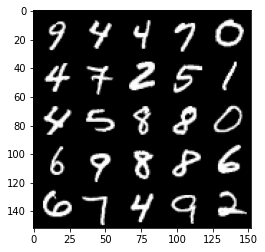

Step 57500: Generator loss: 1.7467225294113164, discriminator loss: 0.3758950872421261


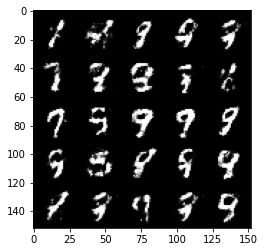

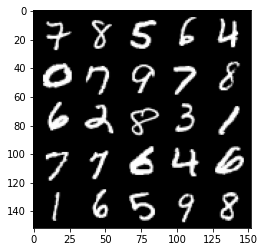

Step 58000: Generator loss: 1.8251947484016418, discriminator loss: 0.3639029330313204


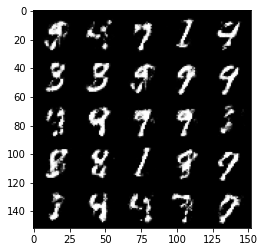

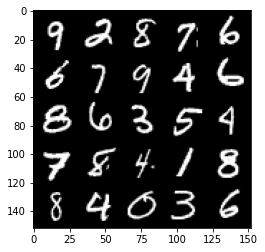

Step 58500: Generator loss: 1.773060440778733, discriminator loss: 0.3825013979077334


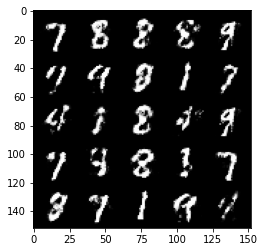

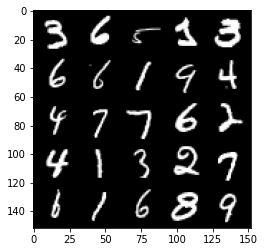

Step 59000: Generator loss: 1.751415255308151, discriminator loss: 0.3740209283828733


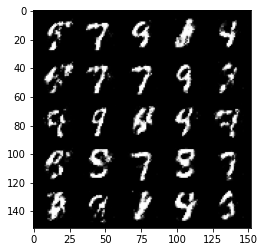

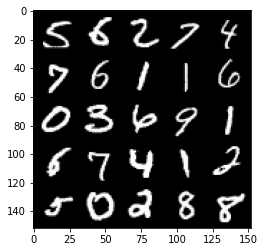

Step 59500: Generator loss: 1.805472337245942, discriminator loss: 0.3543811523914339


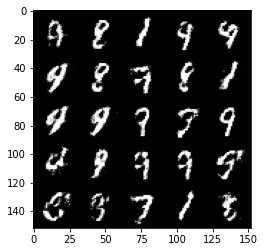

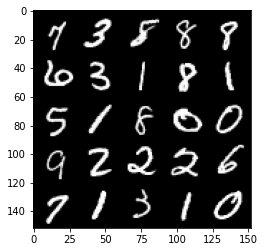

Step 60000: Generator loss: 1.8735784649848932, discriminator loss: 0.3533462826907635


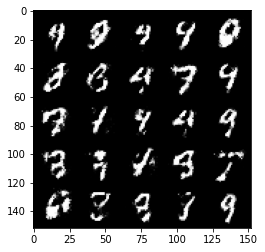

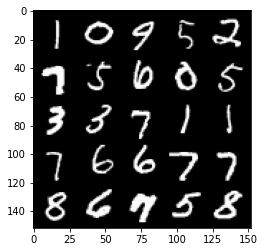

Step 60500: Generator loss: 1.7779828338623034, discriminator loss: 0.3685130610466006


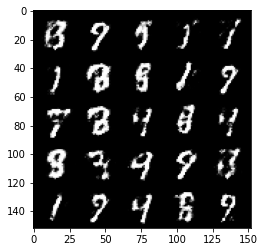

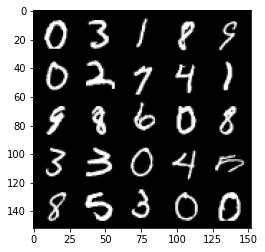

Step 61000: Generator loss: 1.762236326456071, discriminator loss: 0.3727428386211394


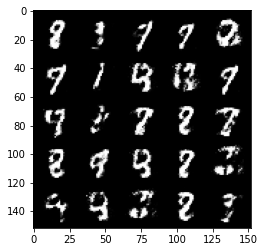

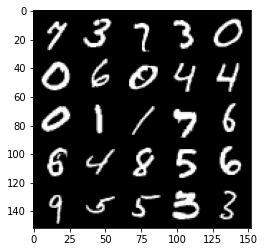

Step 61500: Generator loss: 1.723091290473937, discriminator loss: 0.3807501021623608


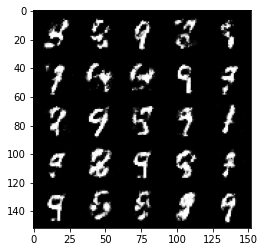

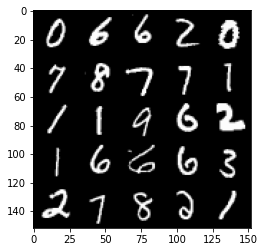

Step 62000: Generator loss: 1.7171945970058435, discriminator loss: 0.3858494203686712


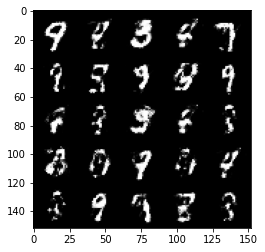

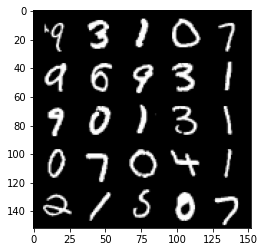

Step 62500: Generator loss: 1.7210291335582726, discriminator loss: 0.381379765033722


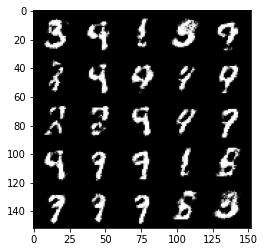

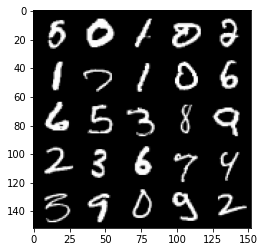

Step 63000: Generator loss: 1.7188783440589894, discriminator loss: 0.3779791835546497


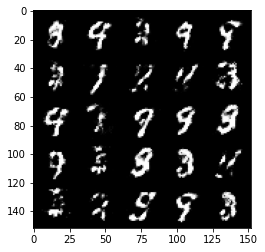

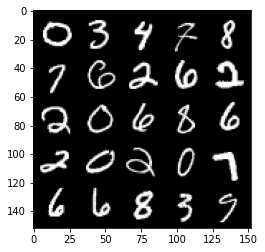

Step 63500: Generator loss: 1.615952813386916, discriminator loss: 0.40431575793027935


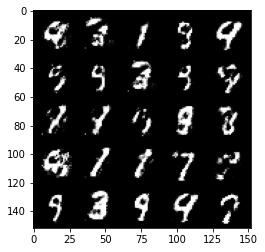

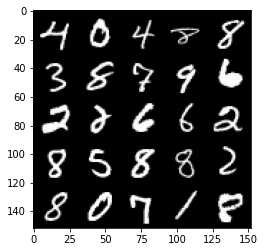

Step 64000: Generator loss: 1.6490877439975737, discriminator loss: 0.39950276768207504


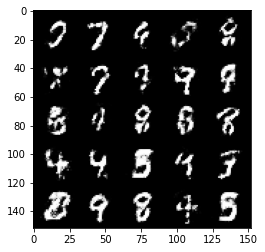

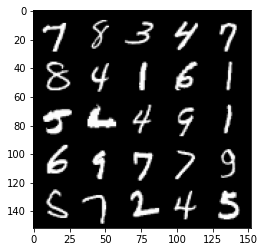

Step 64500: Generator loss: 1.6683602619171154, discriminator loss: 0.39464544713497124


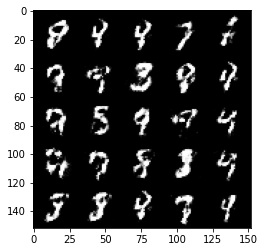

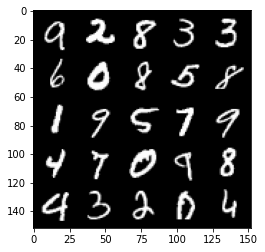

Step 65000: Generator loss: 1.6031591131687177, discriminator loss: 0.4123718396425245


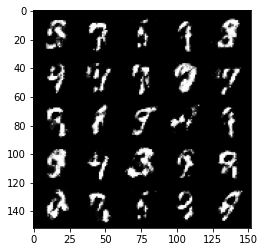

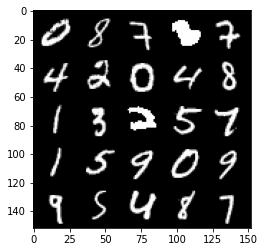

Step 65500: Generator loss: 1.61892808485031, discriminator loss: 0.39701874279975885


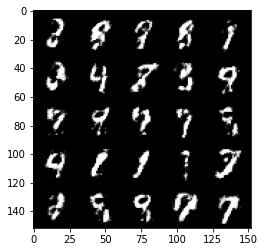

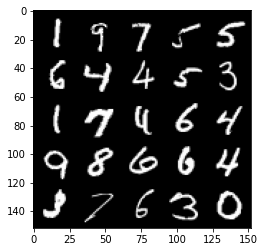

Step 66000: Generator loss: 1.610106967687607, discriminator loss: 0.4098833053112027


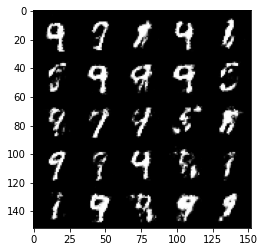

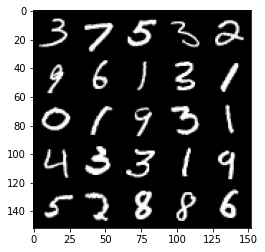

Step 66500: Generator loss: 1.510290585756301, discriminator loss: 0.42593906903266915


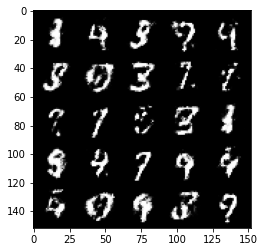

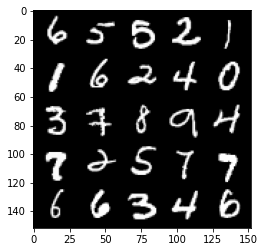

Step 67000: Generator loss: 1.599393012762069, discriminator loss: 0.40317764019966096


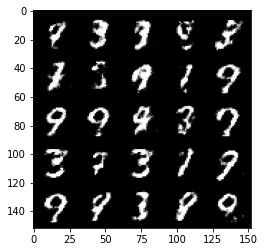

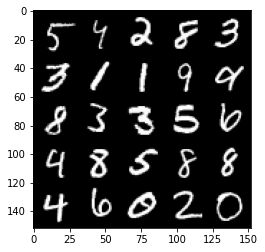

Step 67500: Generator loss: 1.561032976388931, discriminator loss: 0.42208575040102


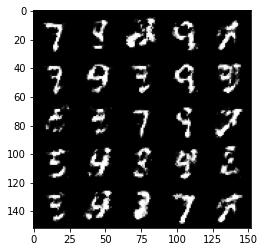

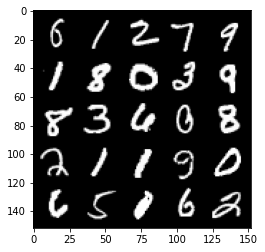

Step 68000: Generator loss: 1.6079214377403261, discriminator loss: 0.4091202924847603


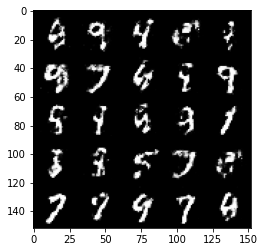

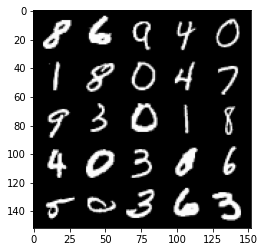

Step 68500: Generator loss: 1.5750270373821258, discriminator loss: 0.4254347510933876


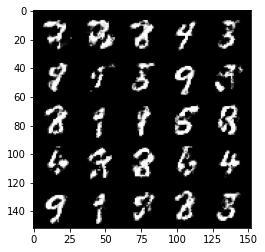

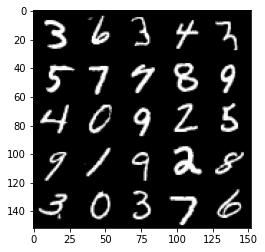

Step 69000: Generator loss: 1.4783955516815193, discriminator loss: 0.43779839980602264


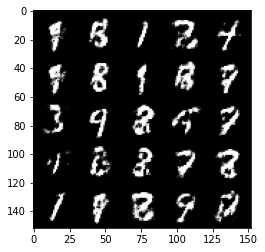

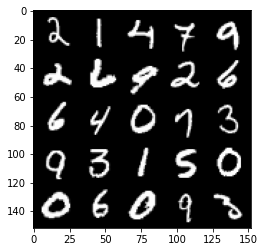

Step 69500: Generator loss: 1.4935091190338114, discriminator loss: 0.447676000058651


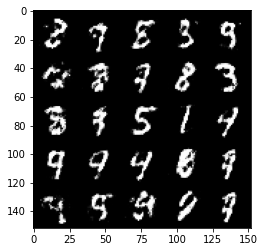

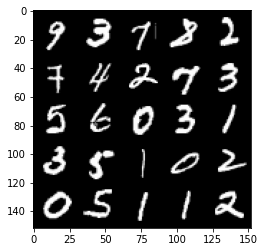

Step 70000: Generator loss: 1.4402855014801021, discriminator loss: 0.4562979968786245


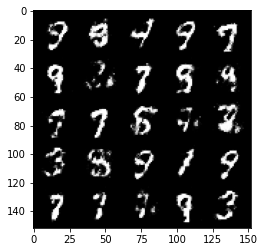

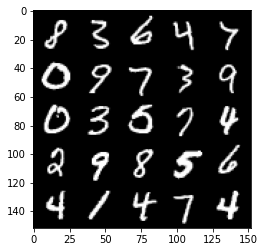

Step 70500: Generator loss: 1.3497298893928524, discriminator loss: 0.4871266250014302


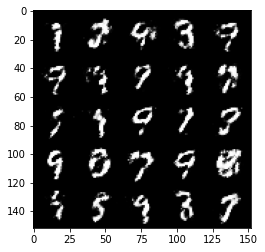

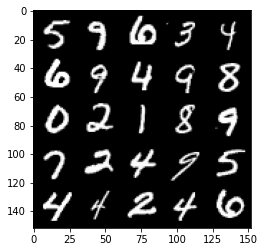

Step 71000: Generator loss: 1.3961184279918677, discriminator loss: 0.4592864830493929


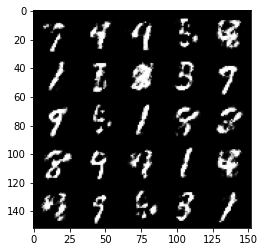

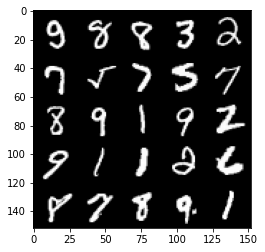

Step 71500: Generator loss: 1.393118778467178, discriminator loss: 0.4644875331521035


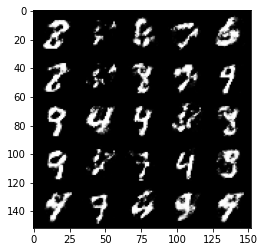

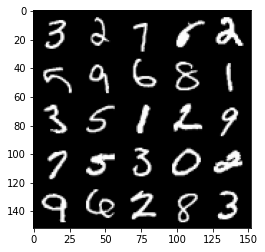

Step 72000: Generator loss: 1.4043773946762086, discriminator loss: 0.454303556263447


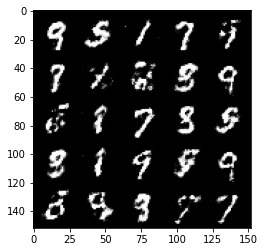

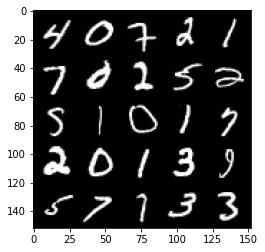

Step 72500: Generator loss: 1.350062645196915, discriminator loss: 0.4717331723570829


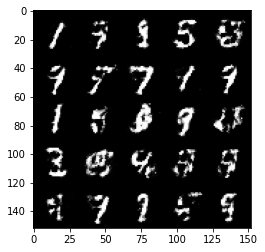

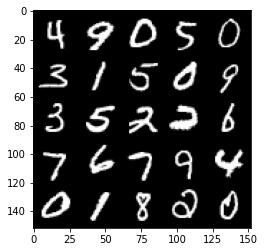

Step 73000: Generator loss: 1.3987792720794685, discriminator loss: 0.45008936280012085


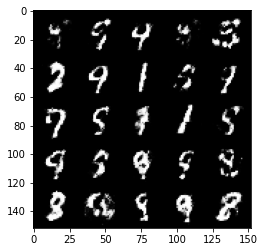

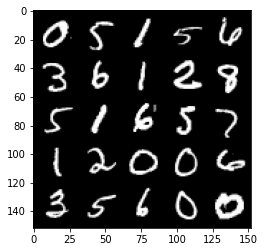

Step 73500: Generator loss: 1.4258735044002548, discriminator loss: 0.4471425933837885


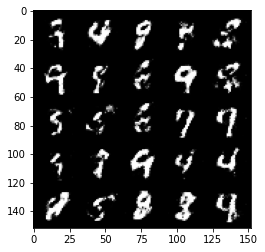

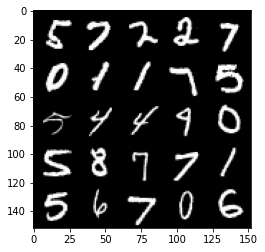

Step 74000: Generator loss: 1.394432808160782, discriminator loss: 0.46877256840467457


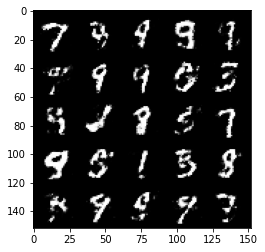

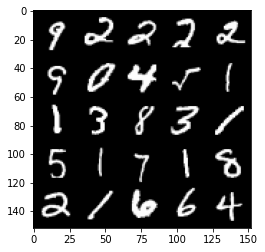

Step 74500: Generator loss: 1.4196498222351066, discriminator loss: 0.45095560944080326


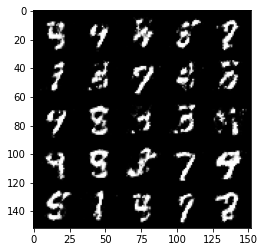

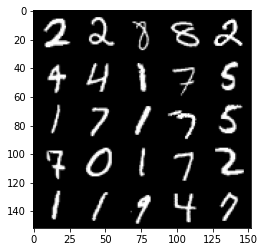

Step 75000: Generator loss: 1.391432379722595, discriminator loss: 0.46851083153486206


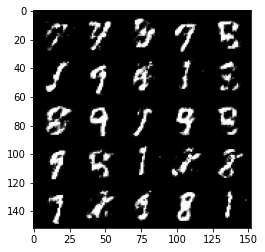

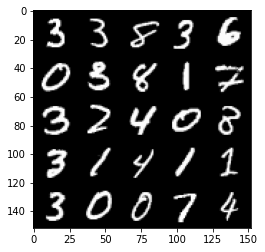

Step 75500: Generator loss: 1.4269825210571285, discriminator loss: 0.4571857697367664


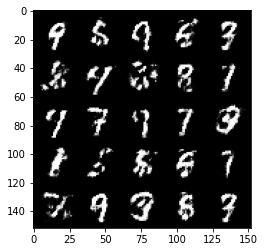

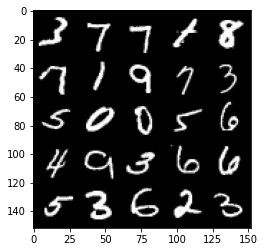

Step 76000: Generator loss: 1.4039381306171428, discriminator loss: 0.4633778262734414


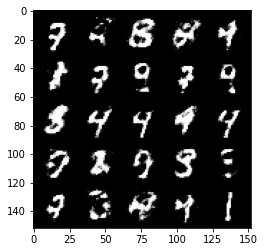

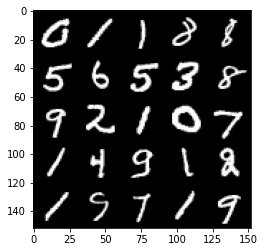

Step 76500: Generator loss: 1.3381053724288943, discriminator loss: 0.47723463618755363


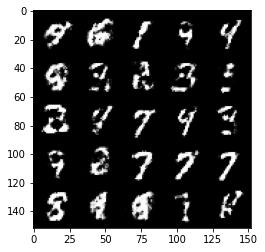

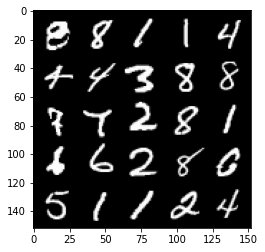

Step 77000: Generator loss: 1.392946139812469, discriminator loss: 0.4657293697595593


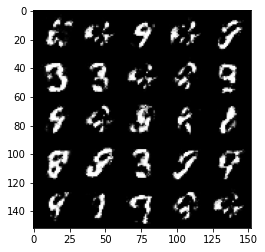

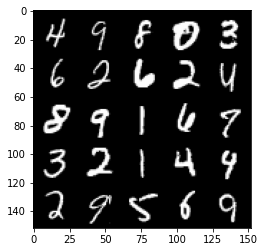

Step 77500: Generator loss: 1.333849577903747, discriminator loss: 0.47292577368020994


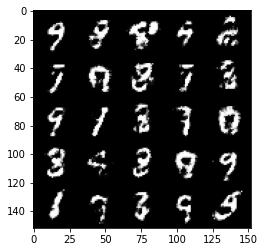

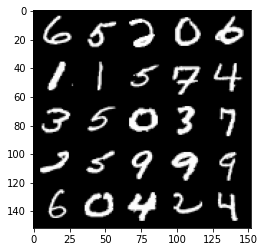

Step 78000: Generator loss: 1.3998629844188688, discriminator loss: 0.45573744696378715


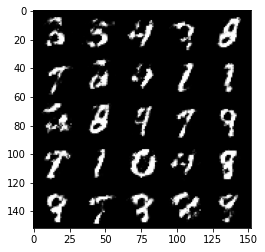

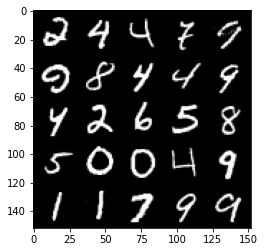

Step 78500: Generator loss: 1.414390842437745, discriminator loss: 0.45233266401290956


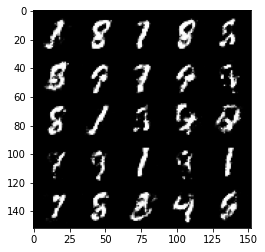

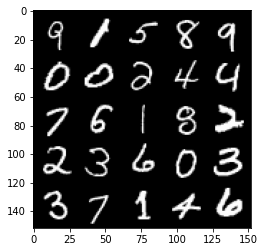

Step 79000: Generator loss: 1.3886809511184688, discriminator loss: 0.45744849085807776


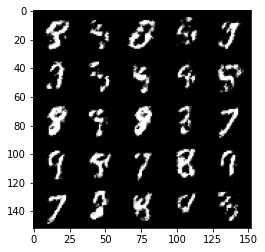

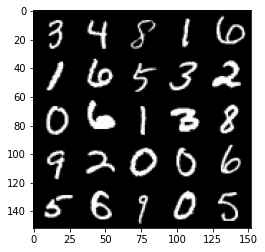

Step 79500: Generator loss: 1.3878709347248082, discriminator loss: 0.45507749372720707


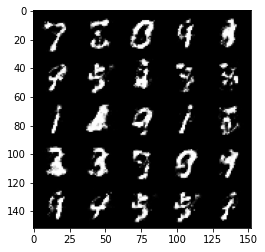

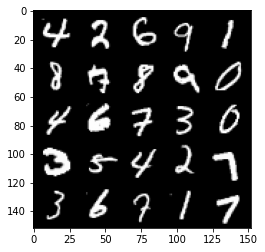

Step 80000: Generator loss: 1.3461959192752841, discriminator loss: 0.48059434086084396


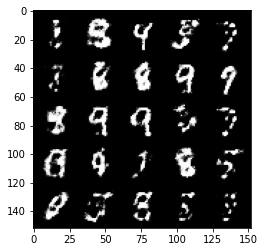

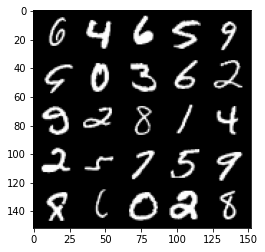

Step 80500: Generator loss: 1.3847868251800521, discriminator loss: 0.45262237685918844


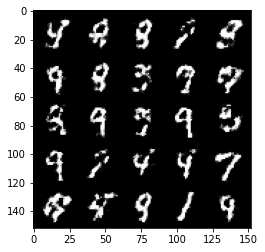

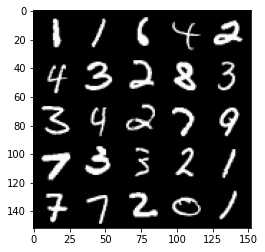

Step 81000: Generator loss: 1.4281864774227142, discriminator loss: 0.45111006659269315


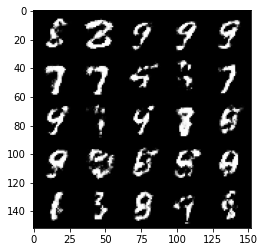

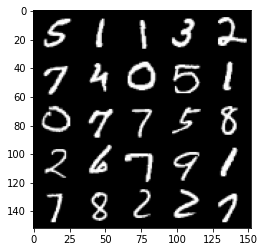

Step 81500: Generator loss: 1.3644579505920404, discriminator loss: 0.46657902932167067


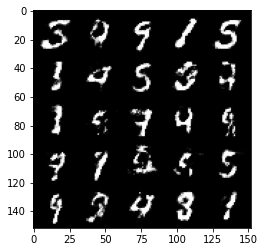

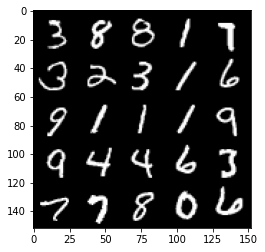

Step 82000: Generator loss: 1.362974000453948, discriminator loss: 0.4578565559387207


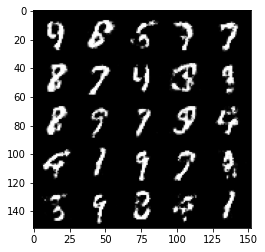

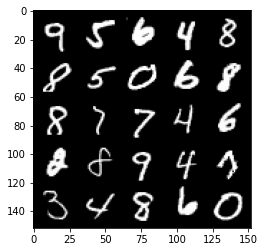

Step 82500: Generator loss: 1.3286356928348542, discriminator loss: 0.47282212740182866


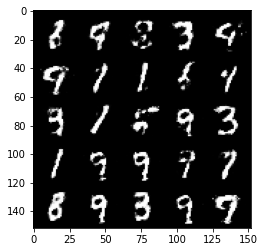

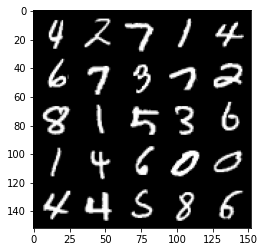

Step 83000: Generator loss: 1.3623963959217078, discriminator loss: 0.4565789707303046


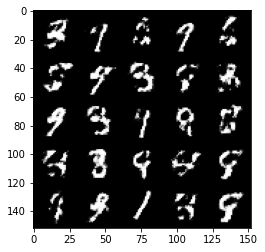

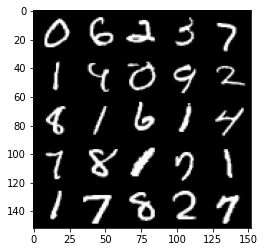

Step 83500: Generator loss: 1.3819146103858935, discriminator loss: 0.44879945123195675


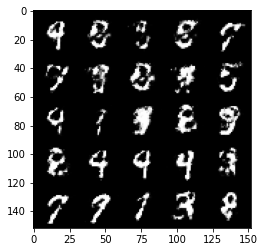

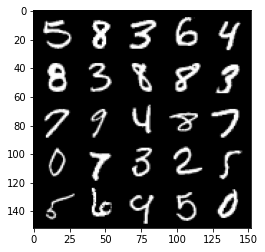

Step 84000: Generator loss: 1.382306582450866, discriminator loss: 0.4526125688552857


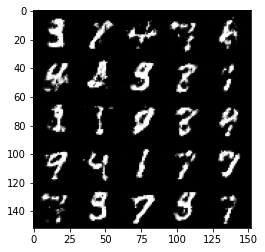

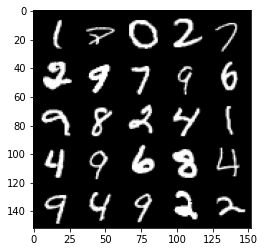

Step 84500: Generator loss: 1.3333130624294283, discriminator loss: 0.48355635410547254


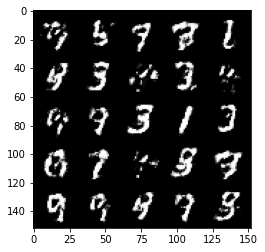

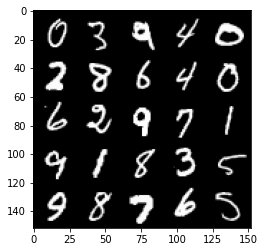

Step 85000: Generator loss: 1.3505200414657594, discriminator loss: 0.47008324259519585


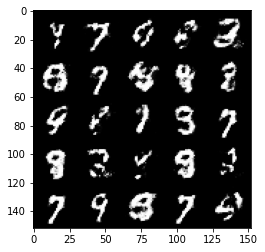

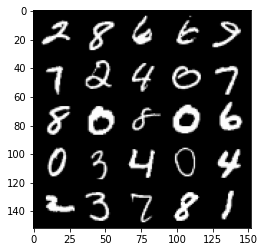

Step 85500: Generator loss: 1.3081737496852863, discriminator loss: 0.48314367252588275


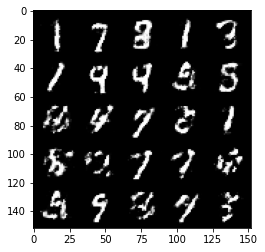

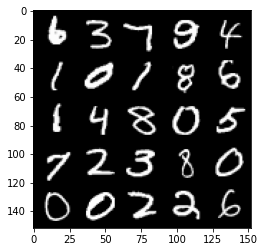

Step 86000: Generator loss: 1.2895932378768922, discriminator loss: 0.49379853433370563


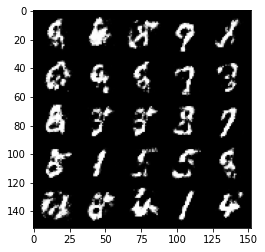

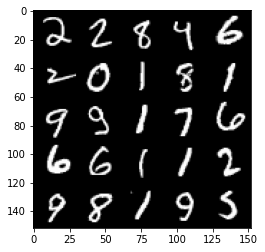

Step 86500: Generator loss: 1.2960381139516817, discriminator loss: 0.4875192729830742


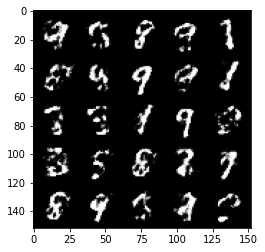

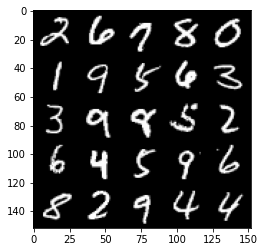

Step 87000: Generator loss: 1.3110797400474552, discriminator loss: 0.47141335064172735


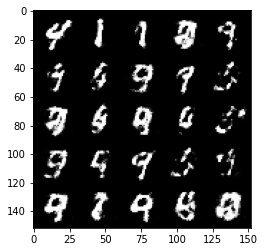

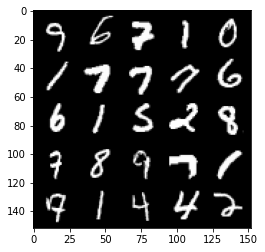

Step 87500: Generator loss: 1.2302507812976842, discriminator loss: 0.5030487260222433


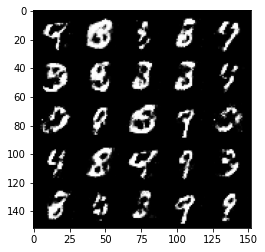

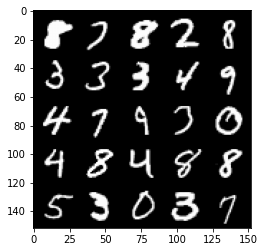

Step 88000: Generator loss: 1.264263573169708, discriminator loss: 0.4854044252634045


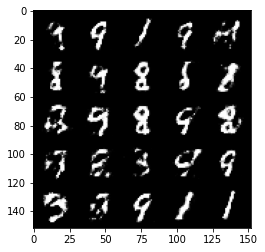

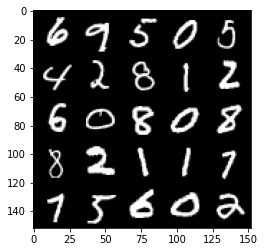

Step 88500: Generator loss: 1.2143266925811753, discriminator loss: 0.5004947984218597


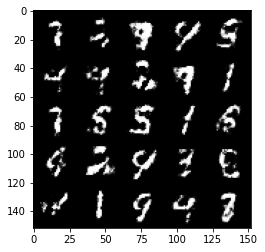

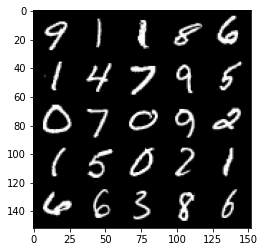

Step 89000: Generator loss: 1.2132094051837905, discriminator loss: 0.4911549087762832


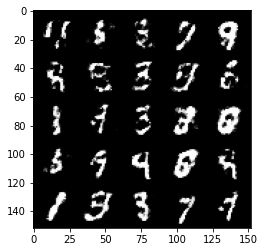

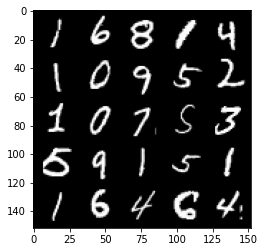

Step 89500: Generator loss: 1.2477359724044788, discriminator loss: 0.49080541092157387


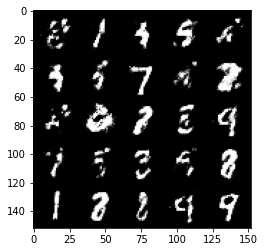

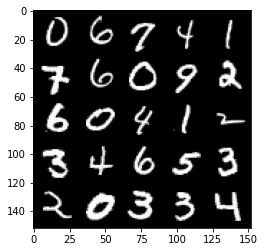

Step 90000: Generator loss: 1.254631622433662, discriminator loss: 0.4839169287085534


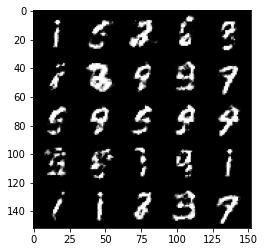

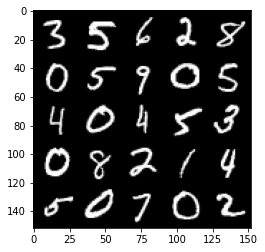

Step 90500: Generator loss: 1.2447375564575203, discriminator loss: 0.4923524526357654


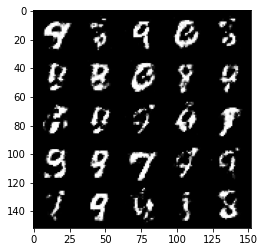

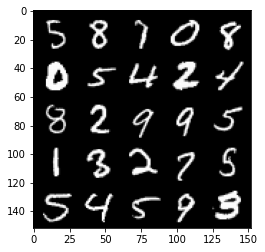

Step 91000: Generator loss: 1.280623551368714, discriminator loss: 0.4871605929732324


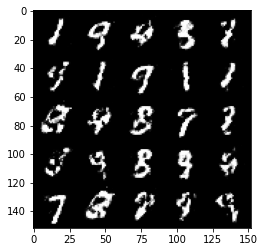

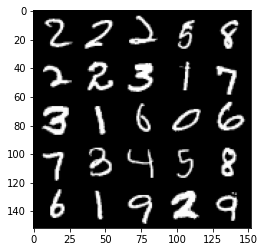

Step 91500: Generator loss: 1.3023272657394411, discriminator loss: 0.47109893953800186


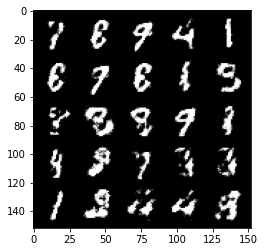

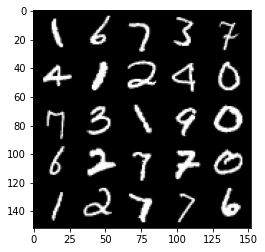

Step 92000: Generator loss: 1.2749260187149047, discriminator loss: 0.4815149145722387


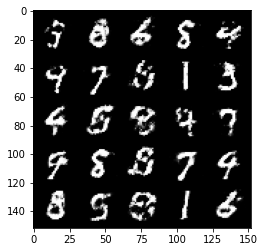

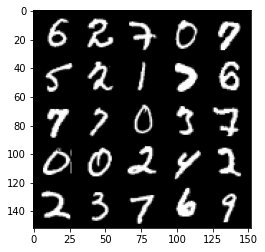

Step 92500: Generator loss: 1.2799803805351258, discriminator loss: 0.4872006669640538


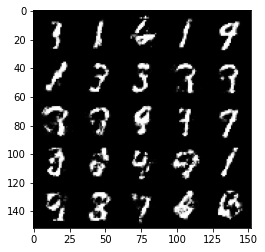

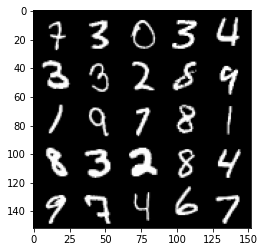

Step 93000: Generator loss: 1.271247869491577, discriminator loss: 0.4805746117830278


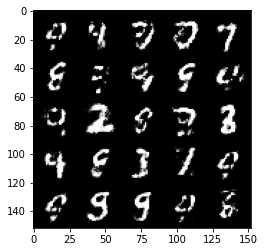

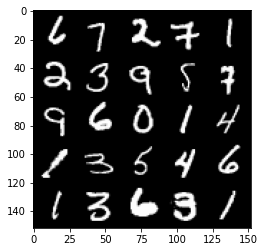

Step 93500: Generator loss: 1.330035105228424, discriminator loss: 0.46139953583478915


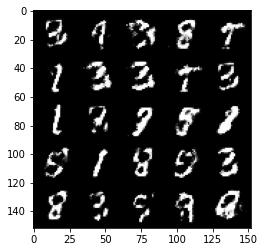

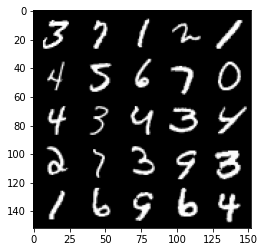

In [12]:
step_i = 0
mean_gen_loss = 0
mean_disc_loss = 0
test_gen = True # whether the generator should be tested
gen_loss = False
error = False

for epoch in range(n_epochs):

  # Dataloader returns the batches
  for real_img, _ in tqdm(dataloader):
    batch_size_i = len(real_img)

    # Flatten the batch of real images from the dataset
    real_img = real_img.view(batch_size_i, -1).to(device)

    ### update discriminator
    # zero out the gradients before backpropagation
    disc_opt.zero_grad() 
    # calculate discriminator loss
    disc_loss = get_disc_loss(gen, disc, criterion, real_img, batch_size_i, noise_dim, device)
    # update gradients
    disc_loss.backward(retain_graph=True) 
    # update optimizer
    disc_opt.step()

    # to keep track of the generator weights, for testing purposes
    if test_gen:
      old_gen_weights = gen.gen[0][0].weight.detach().clone()

    ### update generator
    # zero out the gradients
    gen_opt.zero_grad() 
    # calculate loss
    gen_loss = get_gen_loss(gen, disc, criterion, batch_size_i, noise_dim, device)
    # update gradients
    gen_loss.backward()
    # update optimizer
    gen_opt.step()

    # to check if the generator weights are changing, for testing purposes
    if test_gen:
      try:
        assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abd.max() < 0.00005 and epoch == 0)
        assert torch.any(gen.gen[0][0].weight.detach().clone() != old_gen_weights)
      except:
        error = True
        print('Runtime tests have failed')
    
    # keep track of the average discriminator loss
    mean_disc_loss += disc_loss.item() / viz_step

    # keep track of the average generator loss
    mean_gen_loss += gen_loss.item() / viz_step

    ### Visualization
    if step_i % viz_step == 0 and step_i > 0:
      print(f"Step {step_i}: Generator loss: {mean_gen_loss}, discriminator loss: {mean_disc_loss}")
      noise_vec = get_noise(batch_size_i, noise_dim, device=device)
      fake_img = gen(noise_vec)
      tensor_image_viz(fake_img)
      tensor_image_viz(real_img)
      mean_gen_loss = 0
      mean_disc_loss = 0
    step_i += 1


